# Занятие 6

######    1) Разбор ДЗ
######    2) Проект
###### 3) Визуализация
######    4) Гиперпараметры
######    5) Ансамбли


# Разбор ДЗ

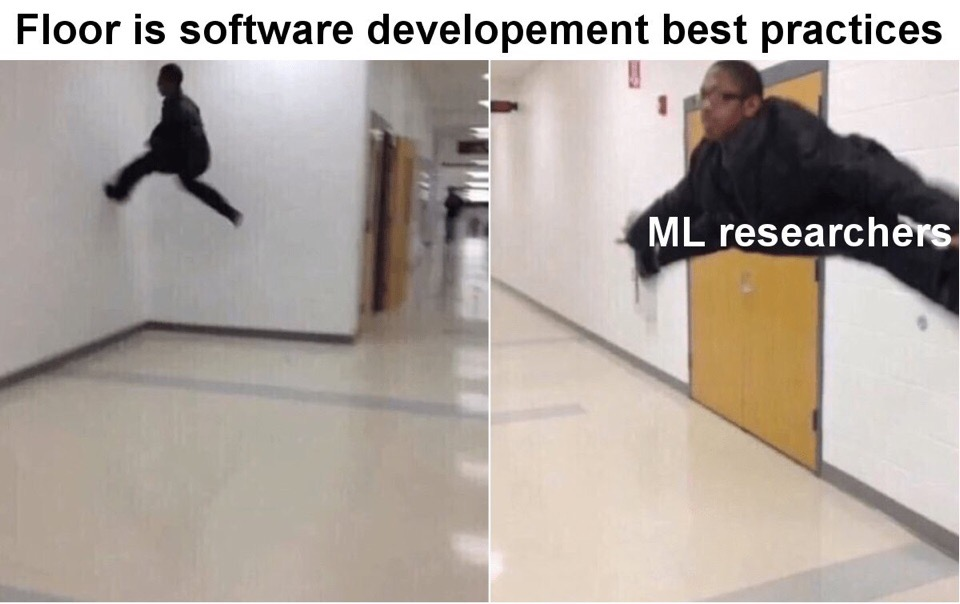

In [54]:
import pandas as pd

In [55]:
df = pd.read_excel('/mnt/c/ds/DataSet_w_NA.xlsx', sheet_name="Испорченные факты")

In [56]:
df = df.dropna()


In [57]:
# Создаем сводную табличку
df =pd.pivot_table(df, values=['Продажи, руб', 'Продажи, шт','Повторение заказа','Маржинальная прибыль','Повторение товара'], index=["Факты.Товар ID"],
                     aggfunc={'Продажи, шт': [np.median, np.sum],
                              'Продажи, руб': np.sum,
                              'Повторение заказа': np.sum,
                              'Маржинальная прибыль': np.sum
                        
                               })
df.head()

Маржинальная прибыль Повторение заказа Продажи, руб  \
                                sum               sum          sum   
Факты.Товар ID                                                       
PROD0000001               -28160.70                 6     631978.5   
PROD0000002               963721.00                32    5318764.0   
PROD0000003                32200.55                18      76755.0   
PROD0000004              -266380.65                17    3621384.0   
PROD0000005                31874.40                18     150984.0   

               Продажи, шт        
                    median   sum  
Факты.Товар ID                    
PROD0000001            2.5  12.0  
PROD0000002            3.5  51.0  
PROD0000003            2.0  23.0  
PROD0000004            4.0  29.0  
PROD0000005            5.0  24.0

In [58]:
newname=df.columns.map('_'.join)
df.columns=newname
df=df.reset_index()
df.head()

,Факты.Товар ID,Маржинальная прибыль_sum,Повторение заказа_sum,"Продажи, руб_sum","Продажи, шт_median","Продажи, шт_sum"
0,PROD0000001,-28160.70,6,631978.5,2.5,12.0
1,PROD0000002,963721.00,32,5318764.0,3.5,51.0
2,PROD0000003,32200.55,18,76755.0,2.0,23.0
3,PROD0000004,-266380.65,17,3621384.0,4.0,29.0
4,PROD0000005,31874.40,18,150984.0,5.0,24.0


In [59]:
# Рассчитываем долю, делаем проверку - сумма долей =100
total_sale=df['Продажи, руб_sum'].sum()
df['Доля']=df['Продажи, руб_sum']/total_sale * 100
df['Доля'].sum()

100.0

In [60]:
# Сортируем по столбцу 'Продажи, руб_sum' и считаем кумулятивную сумму
df = df.sort_values(by=('Продажи, руб_sum'), ascending=False)
df=df.assign(sum_d=df['Доля'].cumsum())

In [61]:
# Определяем АВС классы
df.loc[(df['sum_d'] <= 80), 'ABC'] = 'A'
df.loc[(df['sum_d'] > 80) & (df['sum_d'] <= 95), 'ABC'] = 'B'
df.loc[(df['sum_d'] > 95), 'ABC'] = 'C'

In [62]:
# Считаем значения для следующего периода
df['Стоимость, руб'] = df['Продажи, руб_sum']/df['Продажи, шт_sum']
df['Продажи в следующем периоде']= (df['Продажи, шт_sum'] + df['Продажи, шт_median']) *df['Стоимость, руб']
total_sale_next=df['Продажи в следующем периоде'].sum()
df['Доля_будущая']=df['Продажи в следующем периоде']/total_sale_next * 100
df = df.sort_values(by=('Продажи в следующем периоде'), ascending=False)
df=df.assign(sum_d_next=df['Доля_будущая'].cumsum())
df

,Факты.Товар ID,Маржинальная прибыль_sum,Повторение заказа_sum,"Продажи, руб_sum","Продажи, шт_median","Продажи, шт_sum",Доля,sum_d,ABC,"Стоимость, руб",Продажи в следующем периоде,Доля_будущая,sum_d_next
1388,PROD0001406,1.259996e+07,17,30799912.0,4.0,20.0,2.681845,2.681845,A,1.539996e+06,3.695989e+07,2.691941,2.691941
1411,PROD0001430,-9.055392e+05,7,11319240.0,6.0,6.0,0.985602,4.862673,A,1.886540e+06,2.263848e+07,1.648854,4.340795
450,PROD0000454,3.876520e+06,23,13726692.0,3.0,31.0,1.195226,3.877071,A,4.427965e+05,1.505508e+07,1.096523,5.437318
483,PROD0000488,2.328306e-10,15,10935288.0,5.0,39.0,0.952170,5.814843,A,2.803920e+05,1.233725e+07,0.898572,6.335891
1629,PROD0001657,2.047488e+06,6,9187447.5,4.0,12.0,0.799980,9.126346,A,7.656206e+05,1.224993e+07,0.892213,7.228103
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,PROD0001257,1.050000e+03,12,4200.0,2.5,5.0,0.000366,99.997704,C,8.400000e+02,6.300000e+03,0.000459,99.998575
1108,PROD0001119,2.220000e+02,13,4884.0,1.5,6.0,0.000425,99.996103,C,8.140000e+02,6.105000e+03,0.000445,99.999020
801,PROD0000808,1.702000e+03,2,4048.0,2.5,5.0,0.000352,99.998056,C,8.096000e+02,6.072000e+03,0.000442,99.999462
1675,PROD0001703,1.411200e+03,1,2880.0,2.0,2.0,0.000251,99.999929,C,1.440000e+03,5.760000e+03,0.000420,99.999882


In [63]:
df.loc[(df['sum_d_next'] <= 80), 'ABC_next'] = 'A'
df.loc[(df['sum_d_next'] > 80) & (df['sum_d_next'] <= 95), 'ABC_next'] = 'B'
df.loc[(df['sum_d_next'] > 95), 'ABC_next'] = 'C'
df

,Факты.Товар ID,Маржинальная прибыль_sum,Повторение заказа_sum,"Продажи, руб_sum","Продажи, шт_median","Продажи, шт_sum",Доля,sum_d,ABC,"Стоимость, руб",Продажи в следующем периоде,Доля_будущая,sum_d_next,ABC_next
1388,PROD0001406,1.259996e+07,17,30799912.0,4.0,20.0,2.681845,2.681845,A,1.539996e+06,3.695989e+07,2.691941,2.691941,A
1411,PROD0001430,-9.055392e+05,7,11319240.0,6.0,6.0,0.985602,4.862673,A,1.886540e+06,2.263848e+07,1.648854,4.340795,A
450,PROD0000454,3.876520e+06,23,13726692.0,3.0,31.0,1.195226,3.877071,A,4.427965e+05,1.505508e+07,1.096523,5.437318,A
483,PROD0000488,2.328306e-10,15,10935288.0,5.0,39.0,0.952170,5.814843,A,2.803920e+05,1.233725e+07,0.898572,6.335891,A
1629,PROD0001657,2.047488e+06,6,9187447.5,4.0,12.0,0.799980,9.126346,A,7.656206e+05,1.224993e+07,0.892213,7.228103,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,PROD0001257,1.050000e+03,12,4200.0,2.5,5.0,0.000366,99.997704,C,8.400000e+02,6.300000e+03,0.000459,99.998575,C
1108,PROD0001119,2.220000e+02,13,4884.0,1.5,6.0,0.000425,99.996103,C,8.140000e+02,6.105000e+03,0.000445,99.999020,C
801,PROD0000808,1.702000e+03,2,4048.0,2.5,5.0,0.000352,99.998056,C,8.096000e+02,6.072000e+03,0.000442,99.999462,C
1675,PROD0001703,1.411200e+03,1,2880.0,2.0,2.0,0.000251,99.999929,C,1.440000e+03,5.760000e+03,0.000420,99.999882,C


###### Метод RandomForestClassifier

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score, classification_report
from sklearn.metrics import confusion_matrix

In [ ]:
df=df.set_index('Факты.Товар ID')


In [ ]:
X = df.drop('ABC', axis=1)  
X = X.drop('ABC_next', axis=1)  
y = df['ABC_next'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state = 2020, stratify=y)
y_train = np.array(y_train)

In [ ]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
display(rfc.score(X_train, y_train))

In [ ]:
y_pred = rfc.predict(X_test)
conf_matrix_baseline = pd.DataFrame(confusion_matrix(y_test, y_pred))
conf_matrix_baseline

In [ ]:
report1 = classification_report(y_test, y_pred, target_names=['A', 'B', 'C'])
print(report)

---

In [65]:
df = pd.read_excel('/mnt/c/ds/DataSet_w_NA.xlsx', sheet_name="Испорченные факты")

In [70]:
df =pd.pivot_table(df, values=['Продажи, руб', 'Продажи, шт','Повторение заказа','Маржинальная прибыль','Повторение товара'], index=["Факты.Товар ID"],
                     aggfunc={'Продажи, шт': [np.median, np.sum],
                              'Продажи, руб': np.sum,
                              'Повторение заказа': np.sum,
                              'Маржинальная прибыль': np.sum})
newname=df.columns.map('_'.join)
df.columns=newname
df=df.reset_index()
total_sale=df['Продажи, руб_sum'].sum()
df['Доля']=df['Продажи, руб_sum']/total_sale * 100
df = df.sort_values(by=('Продажи, руб_sum'), ascending=False)
df=df.assign(sum_d=df['Доля'].cumsum())
df.loc[(df['sum_d'] <= 80), 'ABC'] = 'A'
df.loc[(df['sum_d'] > 80) & (df['sum_d'] <= 95), 'ABC'] = 'B'
df.loc[(df['sum_d'] > 95), 'ABC'] = 'C'

df['Стоимость, руб'] = df['Продажи, руб_sum']/df['Продажи, шт_sum']
df['Продажи в следующем периоде']= (df['Продажи, шт_sum'] + df['Продажи, шт_median']) *df['Стоимость, руб']
total_sale_next=df['Продажи в следующем периоде'].sum()
df['Доля_будущая']=df['Продажи в следующем периоде']/total_sale_next * 100
df = df.sort_values(by=('Продажи в следующем периоде'), ascending=False)
df=df.assign(sum_d_next=df['Доля_будущая'].cumsum())
df.loc[(df['sum_d_next'] <= 80), 'ABC_next'] = 'A'
df.loc[(df['sum_d_next'] > 80) & (df['sum_d_next'] <= 95), 'ABC_next'] = 'B'
df.loc[(df['sum_d_next'] > 95), 'ABC_next'] = 'C'



KeyError: 'Продажи, руб'

In [71]:
df_clean = df.drop(columns=['Факты.Товар ID', 
                            'Продажи, шт_median', 
                            'Доля', 'sum_d', 
                            'Продажи в следующем периоде', 
                            'Доля_будущая', 
                            'sum_d_next'])


In [72]:
df_clean = df_clean.dropna()
df_clean.loc[(df_clean['ABC'] == 'A'), 'class'] = '0'
df_clean.loc[(df_clean['ABC'] == 'B'), 'class'] = '1'
df_clean.loc[(df_clean['ABC'] == 'C'), 'class'] = '2'
df_clean.loc[(df_clean['ABC_next'] == 'A'), 'class_next'] = '0'
df_clean.loc[(df_clean['ABC_next'] == 'B'), 'class_next'] = '1'
df_clean.loc[(df_clean['ABC_next'] == 'C'), 'class_next'] = '2'
df_clean = df_clean.drop(columns=['ABC', 'ABC_next'])
df_clean

,Маржинальная прибыль_sum,Повторение заказа_sum,"Продажи, руб_sum","Продажи, шт_sum","Стоимость, руб",class,class_next
1388,1.259996e+07,17,30799912.0,20.0,1.539996e+06,0,0
1411,-9.055392e+05,7,11319240.0,6.0,1.886540e+06,0,0
450,3.876520e+06,23,13726692.0,31.0,4.427965e+05,0,0
483,2.328306e-10,15,10935288.0,39.0,2.803920e+05,0,0
1629,2.047488e+06,6,9187447.5,12.0,7.656206e+05,0,0
...,...,...,...,...,...,...,...
2037,2.423287e+06,1,0.0,9.0,0.000000e+00,2,2
2062,2.897074e+06,1,0.0,5.0,0.000000e+00,2,2
2061,5.577500e+05,1,0.0,13.0,0.000000e+00,2,2
2060,2.941491e+06,1,0.0,12.0,0.000000e+00,2,2


In [73]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

def print_res(Y_test, Y_pred, name):
    print(f'{name}:')
    print(f'Accuracy: {metrics.accuracy_score(Y_test, Y_pred)}')
    # Понимаю, что убогий цикл, но пока не настолько питонист, чтобы делать без него
    test, pred = list(Y_test), list(Y_pred)
    classified = 0
    for i in range(len(test)):
        if test[i] == pred[i]:
            classified += 1
    print(f'{classified} of {len(test)}')
    matrix = metrics.confusion_matrix(Y_test, Y_pred)
    cm=pd.DataFrame(matrix,index=['A','B','C'],columns=['A','B','C'])
    print(cm)
    
def classify(X_train, Y_train, X_test, classifier, name):
    classifier.fit(X_train,Y_train)
    Y_pred=classifier.predict(X_test)
    print_res(Y_test, Y_pred, name)
    
X = df_clean.drop(columns='class_next')
Y = df_clean['class_next']

SS = StandardScaler()
X_scaled = SS.fit_transform(X)

X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=0.3, shuffle=True)

classify(X_train, Y_train, X_test, classifier=RandomForestClassifier(), name='RandomForest')
print()
classify(X_train, Y_train, X_test, classifier=DecisionTreeClassifier(), name='DecisionTree')
print()
classify(X_train, Y_train, X_test, classifier=KNeighborsClassifier(n_neighbors=5), name='KNN')

RandomForest:
Accuracy: 0.9806138933764136
607 of 619
     A    B    C
A  134    4    0
B    2  132    3
C    0    3  341

DecisionTree:
Accuracy: 0.9660743134087237
598 of 619
     A    B    C
A  130    8    0
B    5  129    3
C    0    5  339

KNN:
Accuracy: 0.9563812600969306
592 of 619
     A    B    C
A  133    5    0
B    7  126    4
C    1   10  333


In [ ]:
def RandomForest_model(features, predict_values):
    X = table[features]
    Y = table['class']
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state = 2020, stratify=Y)
    ss = StandardScaler()
    X_train_scaled = ss.fit_transform(X_train)
    X_test_scaled = ss.transform(X_test)
    y_train = np.array(y_train)
    rfc = RandomForestClassifier(min_samples_leaf=50,
                      n_estimators=150,
                      bootstrap=True,
                      oob_score=True,
                      n_jobs=-1,
                      max_features='auto')
    rfc.fit(X_train_scaled, y_train)
    print(f'RFC score {rfc.score(X_train_scaled, y_train)}')
    y_pred = rfc.predict(X_test_scaled)
    accuracy_score(y_test, y_pred)
    print(f"The accuracy of the model is {round(accuracy_score(y_test, y_pred),3)*100} %")
    predict_data = [predict_values]
    predict_data_scaled = ss.transform(predict_data)
    new_class = rfc.predict(predict_data)
    if new_class[0] in dict_of_classes.keys():
        class_name = dict_of_classes[new_class[0]]
    print(f'Предсказанный класс: {class_name}')

In [74]:
df = pd.read_excel('/mnt/c/ds/DataSet_w_NA.xlsx', sheet_name="Испорченные факты")

In [75]:
df = df.dropna() # минус пустые строки
df = pd.pivot_table(df, values = ['Продажи, руб', 'Продажи, шт','Повторение заказа','Маржинальная прибыль','Повторение товара'], index=["Факты.Товар ID"],
                     aggfunc = {'Продажи, шт': [np.median, np.sum], 'Продажи, руб': np.sum, 'Повторение заказа': np.sum, 'Маржинальная прибыль': np.sum})    
df.columns = df.columns.map('_'.join)
df['Доля'] = df['Продажи, руб_sum'] / df['Продажи, руб_sum'].sum() * 100
df = df.sort_values(by = ('Продажи, руб_sum'), ascending = False) # сортировочка
df = df.assign(sum_d = df['Доля'].cumsum())
 
df.loc[(df['sum_d'] <= 80), 'ABC'] = 'A'
df.loc[(df['sum_d'] > 80) & (df['sum_d'] <= 95), 'ABC'] = 'B'
df.loc[(df['sum_d'] > 95), 'ABC'] = 'C'
df

,Маржинальная прибыль_sum,Повторение заказа_sum,"Продажи, руб_sum","Продажи, шт_median","Продажи, шт_sum",Доля,sum_d,ABC
Факты.Товар ID,,,,,,,,
PROD0001406,1.259996e+07,17,30799912.0,4.0,20.0,2.681845,2.681845,A
PROD0000454,3.876520e+06,23,13726692.0,3.0,31.0,1.195226,3.877071,A
PROD0001430,-9.055392e+05,7,11319240.0,6.0,6.0,0.985602,4.862673,A
PROD0000488,2.328306e-10,15,10935288.0,5.0,39.0,0.952170,5.814843,A
PROD0001187,1.116753e+06,33,9911739.5,3.0,37.0,0.863046,6.677889,A
...,...,...,...,...,...,...,...,...
PROD0001871,1.578500e+03,1,3850.0,2.0,2.0,0.000335,99.999089,C
PROD0001887,1.193400e+03,1,3536.0,2.0,2.0,0.000308,99.999396,C
PROD0001779,1.555200e+03,3,3240.0,1.0,1.0,0.000282,99.999679,C


In [76]:
from sklearn.ensemble import RandomForestClassifier


np.random.seed(0)
df['is_train'] = np.random.uniform(0, 1, len(df)) <= 0.8 # будет ли строчка обучающей?
train, test = df[df['is_train'] == True], df[df['is_train'] == False] # разбиваем на обучающую и тестовую выборки
print(f'Кол-во обучающих данных: {len(train)}\nКол-во тестовых данных: {len(test)}')
features = df.columns[2:3] 
features = features.append(df.columns[5:6])
print(f'\nОбучение по фичам: "{features[0]}" и "{features[1]}"')
y = pd.factorize(train['ABC'])[0]

clf = RandomForestClassifier(n_jobs=2, random_state=0) # создаем классификатор Random Forest
clf.fit(train[features], y) # обучили модель!!!
clf.predict(test[features]) # предсказали для тестовой выборки

lst_signif = list(zip(train[features], clf.feature_importances_)) # значимость факторов
print(f'Значимость фичи: {lst_signif[0][1]}; {lst_signif[1][1]}')

# проверим насколько точно сработал метод 
print('\nConfusion matrix:')
pd.crosstab(test['ABC'], clf.predict(test[features]), rownames=['Настоящие знач.'], colnames=['Предсказанные знач.'])

Кол-во обучающих данных: 1461
Кол-во тестовых данных: 401

Обучение по фичам: "Продажи, руб_sum" и "Доля"
Значимость фичи: 0.5089608258159515; 0.49103917418404847

Confusion matrix:


Предсказанные знач.,0,1,2
Настоящие знач.,,,
A,77,0,0
B,0,103,0
C,0,0,221


In [77]:
from sklearn.ensemble import AdaBoostClassifier
import sklearn.model_selection as mod_s
from sklearn import metrics


df_input = df[['Продажи, руб_sum', 'Доля']] 
df_output = df['ABC']
print(f'\nОбучение по фичам: "{df_input.columns[0]}" и "{df_input.columns[1]}"')
x_train, x_test, y_train, y_test = mod_s.train_test_split(df_input, df_output, test_size = 0.2)
adaB_clas = AdaBoostClassifier(n_estimators = 50, learning_rate = 1) # создаем объект классификатора
adaB = adaB_clas.fit(x_train, y_train) # обучаем модель
y_pred = adaB.predict(x_test) # предсказываем
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
pd.crosstab(y_test, y_pred, rownames = ['Настоящие знач.'], colnames = ['Предсказанные знач.'])


Обучение по фичам: "Продажи, руб_sum" и "Доля"
Accuracy: 0.9973190348525469


Предсказанные знач.,A,B,C
Настоящие знач.,,,
A,85,0,0
B,0,98,1
C,0,0,189


# Проект

Используете ваш датасет по кластеризации, либо выбираете новый

###### 0) Изучаете контекст датасета и придумываете бизнес-цель 

###### 1) Делаете постановку задач на исследование (минимум 2 задачи, 1 под классфификацию/регрессию, 1 под кластеризацию (в крайнем случае делаем допущение что у нас нет Y) , )

###### 2) Оценка Датасета (pandas/np/statsmodel...)

###### 3) Подготовка данных

###### 4) Выполнение исследований ( в том числе с промежуточными итогами, визуализациями)

###### 5) Итоговые визуализации и выводы

###### 6) Предложения по развитию вашей работы

# Визуализация

Построение графиков это такая тема, которую невозможно охватить всю. У вас всё равно будет когда-то пример, который здесь не охвачен.



matplotlib — не единственный пакет для построения графиков, правда чаще всего остальные графопостроители просто делают более удобную обёртку вокруг него. Для графиков, которые регулярно встречаются при анализе данных есть bokeh и seaborn.

Ну и конечно если у вас уже есть какой-то сторонний пакет или библиотека (origin, gnuplot, flot, d3js), с который вы уже умеете строить графики, может оказаться проще с помощью питона переформатировать данные, а отображение делать уже в том, в чём вы чувствуюте себя комфортней.



Однако не стоит забывать, что если у вас задача потоковой обработки данных, и данных много и хочется построить сразу много графиков, то скорее всего построить весь конвейер на питоне будет относительно просто.



Disclaimer большинство примеров здесь, конечно же, основаны на общедоступных туториалах и книгах. Nevertheless, все опечатки и не точности, что вы тут найдёте — на моей совести.



## matplotlab

Первое, что надо сделать, когда работаешь с matplotlab в jupyter, это "включить" соответствующую магию. Тогда картинки будут отображаться прямо в тексте.

(для старых версий)

In [3]:
%matplotlib inline


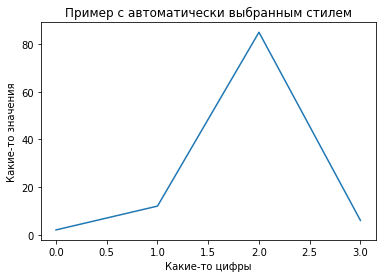

In [4]:
import matplotlib.pyplot as plt

plt.title("Пример с автоматически выбранным стилем")
plt.plot([2, 12, 85, 6])
plt.xlabel("Какие-то цифры")
plt.ylabel("Какие-то значения")
plt.show()

Команда plot достаточно умна и универсальна, ей можно скармливать данные в разных вариантах и она довольно часто будет делать то, что вы ожидаете.

Когда на вход просто последовательность чисел, это воспринимается как значения по вертикальной оси, а по горизонтальной оси эти значения будут просто индексом (именно поэтому в примере выше у 2.0 значение 80
Когда на вход две последовательности, то функция сначала соберёт пары (x, y), последовательно перебирая каждую из последовательностей

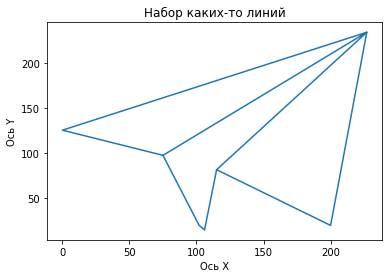

In [5]:
plt.plot(
    [75, 227, 0, 75, 102, 106, 115, 200, 227, 115],
    [97, 234, 125, 97, 19, 14, 81, 19, 234, 81]
)
plt.xlabel("Ось X")
plt.ylabel("Ось Y")
plt.title("Набор каких-то линий")
plt.grid(False)
plt.show()

Это очень удобно, когда вы пытаетесь построить функции, если вы примерно понимаете, в каком диапазоне и зачем, и помните как пользоваться numpy



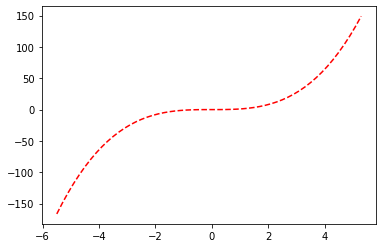

In [6]:
import numpy as np

xx = np.arange(-5.5, 5.5, 0.2)

plt.plot(xx, xx**3, 'r--')
plt.show()

Когда картинку надо сохранить в файл, вместо plt.show используйте plt.savefig. У команды есть некоторые дополнительные параметры, можно, например, указать dpi



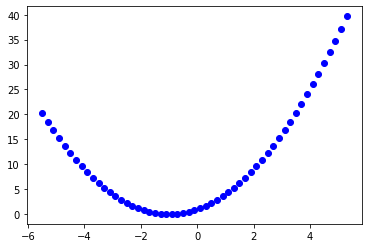

In [10]:
plt.plot(xx, xx**2 + 2*xx + 1, 'bo')
plt.savefig("cuboid.png",dpi=10)

###### Как настроить внешний вид


Настроить можно много всего, например вид линии, длина штрихов, ширина, цвет, подписи, метки на осях ну и том подобное. Есть три способа задать свойства графика, ну и понятно многие из свойств можно установить несколькими способами.



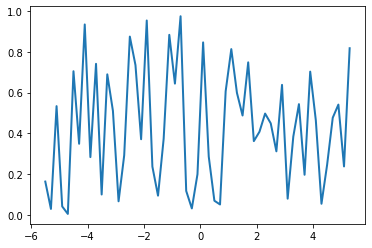

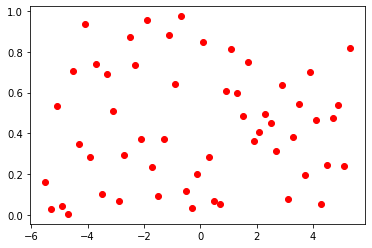

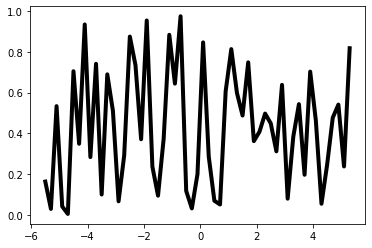

In [11]:
yy = np.random.rand(len(xx))

# через keyword аргументы когда вы закончили уже передавать данные
plt.plot(xx, yy, linewidth=2.0)
plt.show()

# через "третий аргумент". Здесь задаём что у нас красные точки
plt.plot(xx, yy, 'r.', markersize=12)
plt.show()

# можно разделить сам процесс набрасывания точек и финтифлюшки
line = plt.plot(xx, yy)
plt.setp(line, color="k", linewidth=4.0)
plt.show()

Вот некоторые из свойств, которые можно выставить у линии:

    alpha (float) регулирует прозрачность
    color (str) это цвет
    markersize (float) это размер значка
    linestyle стиль линии, например: '-', '--', '-.', ':'
    zorder (float) регулирует порядок графиков, когда у вас их несколько и вы хотите их особым образом накладывать друг на друга
    plt.xlim и plt.ylim позволяют задать диапазоны значений

Если вы уже что-то построили, можно посмотреть, с какими настройками это произошло, что с этим теперь будет, и, может, придумать что можно поменять



  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
  alpha: scalar or None
  animated: bool
  antialiased or aa: bool
  clip_box: `.Bbox`
  clip_on: bool
  clip_path: Patch or (Path, Transform) or None
  color or c: color
  contains: unknown
  dash_capstyle: `.CapStyle` or {'butt', 'projecting', 'round'}
  dash_joinstyle: `.JoinStyle` or {'miter', 'round', 'bevel'}
  dashes: sequence of floats (on/off ink in points) or (None, None)
  data: (2, N) array or two 1D arrays
  drawstyle or ds: {'default', 'steps', 'steps-pre', 'steps-mid', 'steps-post'}, default: 'default'
  figure: `.Figure`
  fillstyle: {'full', 'left', 'right', 'bottom', 'top', 'none'}
  gid: str
  in_layout: bool
  label: object
  linestyle or ls: {'-', '--', '-.', ':', '', (offset, on-off-seq), ...}
  linewidth or lw: float
  marker: marker style string, `~.path.Path` or `~.markers.MarkerStyle`
  markeredgecolor or mec: color
  markeredgewidth or mew: floa

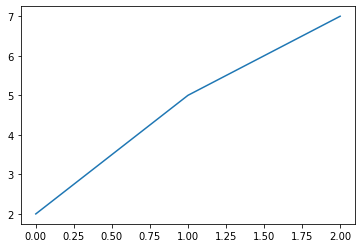

In [12]:
line = plt.plot([2, 5, 7])
plt.setp(line)

###### Сразу несколько графиков


Иногда бывает надо показать зависимость нескольких переменных одновременно и неразрывно. На помощь приходит супер-хитрая система подграфиков в matplotlib. У неё замороченный синтаксис, но в примере внизу мы неявно определяем грид в 2 строчки 3 столбца и сначала рисуем 1 картинку в таком гриде, а потом пятую.



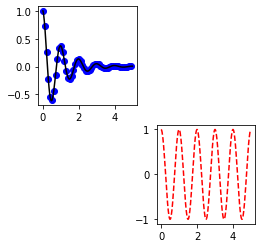

In [13]:
def f(t):
    return np.exp(-t) * np.cos(2*np.pi*t)

t1 = np.arange(0.0, 5.0, 0.1)
t2 = np.arange(0.0, 5.0, 0.02)

plt.subplot(231)
plt.plot(t1, f(t1), 'bo', t2, f(t2), 'k')

plt.subplot(235)
plt.plot(t2, np.cos(2*np.pi*t2), 'r--')
plt.show()

Можно рисовать сразу несколько графиков, это бывает удобно если у вас какая-то сложная логика их построения. В таком случае надо явно давать понять matplotlib-у, какой график вы собираетесь сейчас настроить

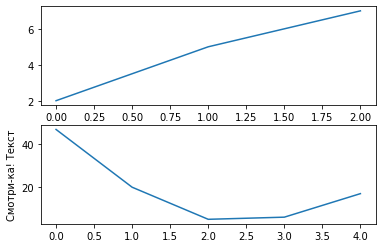

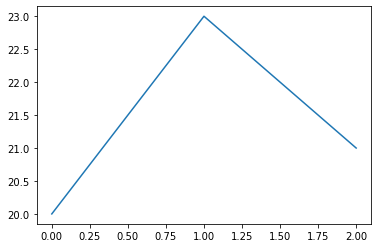

In [14]:
plt.figure(1)
plt.subplot(211)
plt.plot([2, 5, 7])
plt.subplot(212)
plt.plot([47, 20, 5, 6, 17])
plt.ylabel("Смотри-ка! Текст")

plt.figure(2)
plt.plot([20, 23, 21])

plt.show()

Для некоторых графиков полезно ещё перестраивать их в логарифмических осях, к примеру.



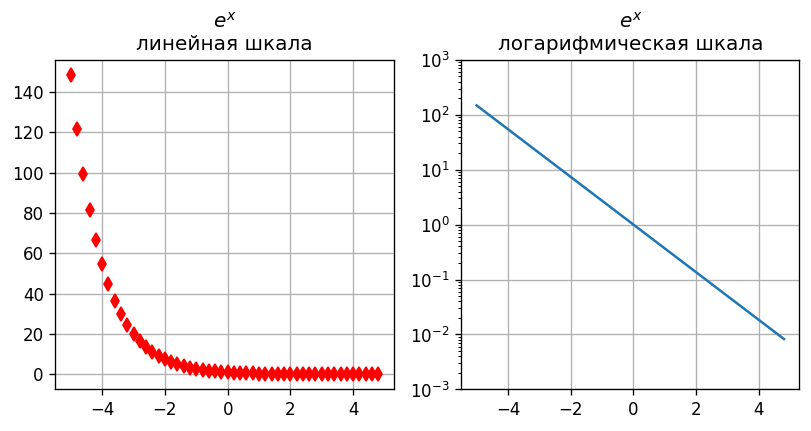

In [15]:
xx = np.arange(-5, 5, 0.2)
yy = np.exp(-xx)

plt.figure(figsize=(8, 8), dpi=120)

plt.subplot(221)
plt.plot(xx, yy, 'rd')
plt.yscale('linear')
plt.title('$e^x$\nлинейная шкала')
plt.grid(True)


# log
plt.subplot(222)
plt.plot(xx, yy)
plt.ylim(1E-3, 1E3)
plt.yscale('log')
plt.title('$e^x$\nлогарифмическая шкала')
plt.grid(True)

###### Другие виды графиков


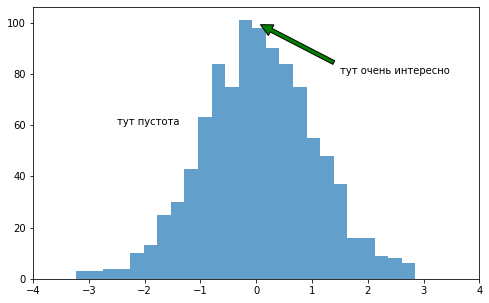

In [16]:
xx = np.random.normal(size=1000)

plt.figure(figsize=(8, 5))
plt.hist(xx, bins=25, alpha=0.7)
plt.text(-2.5, 60, "тут пустота")
plt.xlim(-4, 4)
plt.annotate(
    'тут очень интересно', xy=(0, 100), xytext=(1.5, 80),
    arrowprops=dict(facecolor="green", shrink=0.05)
)
plt.grid(False)
plt.show()

In [ ]:
К графикам также можно добавлять легенду



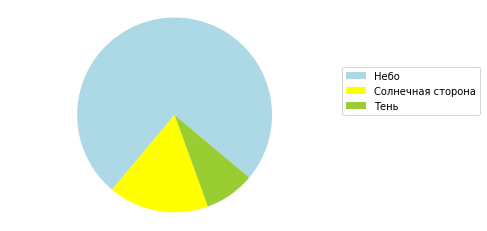

In [17]:
labels = ["Небо", "Солнечная сторона", "Тень"]
sizes = [270, 60, 30] # будет отмасштабировано
colors = ["lightblue", "yellow", "yellowgreen"]

plt.pie(sizes, colors=colors, startangle=-40)
plt.axis("equal")
plt.legend(labels, loc=(1, 0.5))
plt.show()

К сожалению, для сложных случаев всё равно надо сильно заморочиться, без этого не получится. Ниже чуток подтюненый пример из документации scipy, детально состоящий из нескольких частей: мы определили функцию, определили грид и синтерполировали грид на доступные точные значения.



Пример скорее демонстрационный, не переживайте если наскоком не всё поймёте



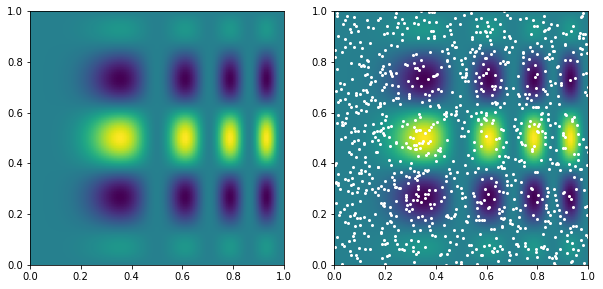

In [18]:
from scipy.interpolate import griddata

XMIN, XMAX, YMIN, YMAX = 0, 1, 0, 1

def func(x, y):    
    return x*(1-x)*np.cos(4*np.pi*x) * np.sin(4*np.pi*y**2)**2
    #return x * np.exp(-x**2 - y**2)

# пусть у нас есть грид
grid_x, grid_y = np.mgrid[XMIN:XMAX:100j, YMIN:YMAX:100j]

points = np.random.rand(1000, 2)
values = func(points[:,0], points[:,1])

zi = griddata(points, values, (grid_x, grid_y), method="linear")
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(func(grid_x, grid_y), extent=(XMIN, XMAX, YMIN, YMAX))
plt.ylim(XMIN, XMAX)
plt.xlim(YMIN, YMAX)
plt.grid(False)


plt.subplot(122)
plt.imshow(func(grid_x, grid_y), extent=(XMIN, XMAX, YMIN, YMAX))

plt.plot(points[:,0], points[:,1], 'w.', ms=4)
plt.ylim(XMIN, XMAX)
plt.xlim(YMIN, YMAX)
plt.grid(False)
plt.show()

###### Подогнать под данные функцию


Нужна функция, данные и scipy.optimize.curve_fit сделает всё за вас



In [20]:
from scipy.optimize import curve_fit


7.204*sin(2.002)*x


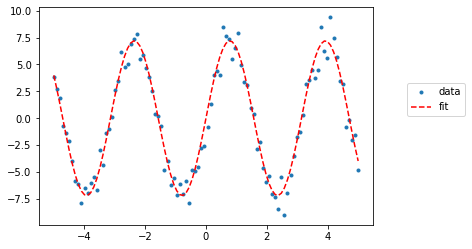

In [21]:
x_data = np.linspace(-5, 5, num=100)
y_data = 7 * np.sin(2 * x_data) + np.random.normal(size=100)

def test_func(x, a, b):
    return a * np.sin(b * x)

params, params_covariance = curve_fit(
    test_func, x_data, y_data, p0=[2, 2]
)
print(f"{params[0]:.3f}*sin({params[1]:.3f})*x")

plt.plot(x_data, y_data, '.')
plt.plot(
    x_data,
    [test_func(x, params[0], params[1]) for x in x_data],
    'r--'
)
plt.legend(["data", "fit"], loc=(1.1, 0.5))
plt.show()

У scipy.optimize есть ещё полезные функции для нахождения минимумов, поиска корней, и тому подобного



https://nbviewer.org/github/jrjohansson/scientific-python-lectures/blob/master/Lecture-4-Matplotlib.ipynb

https://www.kaggle.com/therealcyberlord/coronavirus-covid-19-visualization-prediction

## Статистические графики с seaborn


seaborn это надстройка над matplotlib, у которого куча встроенных удобных определённых графиков уже настроено. Иногда там есть то, что в "голом" matplotlib может быть построить муторно.



/mnt/c/ds/env/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


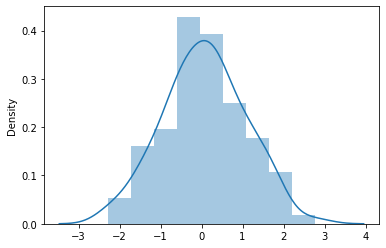

In [22]:
import seaborn as sns

values = np.random.normal(size=100)
sns.distplot(values);


/mnt/c/ds/env/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/mnt/c/ds/env/lib/python3.8/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


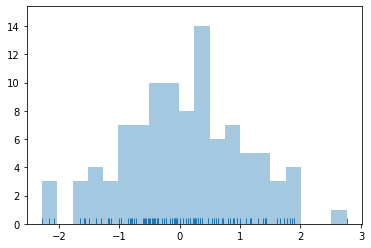

In [23]:
sns.distplot(values, bins=20, kde=False, rug=True);


/mnt/c/ds/env/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/mnt/c/ds/env/lib/python3.8/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


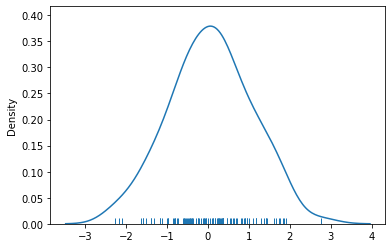

In [24]:
sns.distplot(values, hist=False, rug=True);


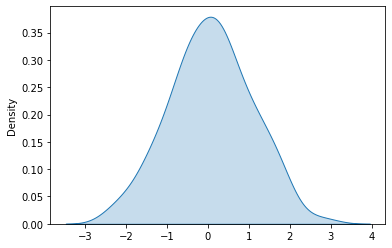

In [25]:
sns.kdeplot(values, shade=True);


Что такое Kernel Density Estimation можно почитать в википедии https://en.wikipedia.org/wiki/Kernel_density_estimation

In [35]:
import pandas as pd


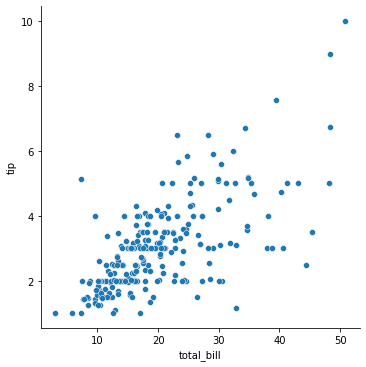

In [26]:
tips = sns.load_dataset("tips")
sns.relplot(x="total_bill", y="tip", data=tips);

In [28]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


Хотя точки отображаются в двух измерениях, к графику можно добавить еще одно измерение, раскрасив точки в соответствии с третьей переменной. В Seaborn это называется использованием «семантики оттенка», потому что цвет точки приобретает значение:



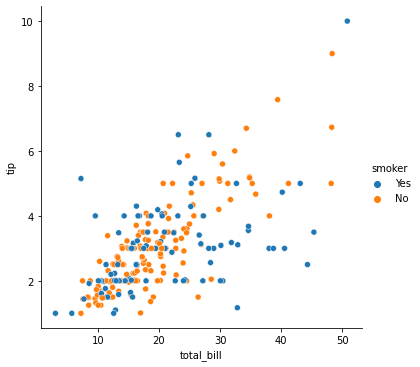

In [29]:
sns.relplot(x="total_bill", y="tip", hue="smoker", data=tips);

Чтобы подчеркнуть разницу между классами и улучшить доступность, вы можете использовать разные стили маркеров для каждого класса:



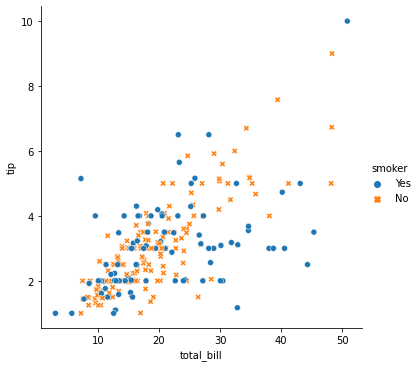

In [30]:
sns.relplot(x="total_bill", y="tip", hue="smoker", style="smoker",
            data=tips);

Также возможно представить четыре переменные, изменяя оттенок и стиль каждой точки независимо. Но делать это нужно осторожно, ведь к форме глаз гораздо менее чувствителен, чем к цвету:



In [ ]:
sns.relplot(x="total_bill", y="tip", hue="smoker", style="time", data=tips);


В приведенных выше примерах семантика оттенка была категориальной, поэтому была применена качественная палитра по умолчанию . Если семантика оттенка является числовой (в частности, если она может быть преобразована в плавающую), раскраска по умолчанию переключается на последовательную палитру:



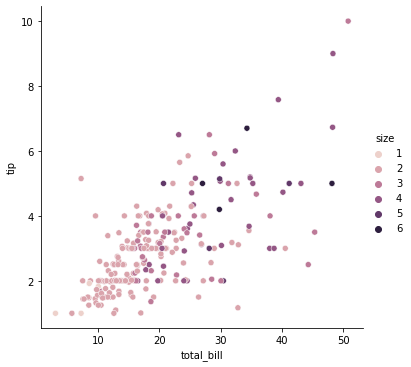

In [32]:
sns.relplot(x="total_bill", y="tip", hue="size", data=tips);


В обоих случаях вы можете настроить цветовую палитру. Для этого есть много вариантов. Здесь мы настраиваем последовательную палитру, используя строковый интерфейс cubehelix_palette():



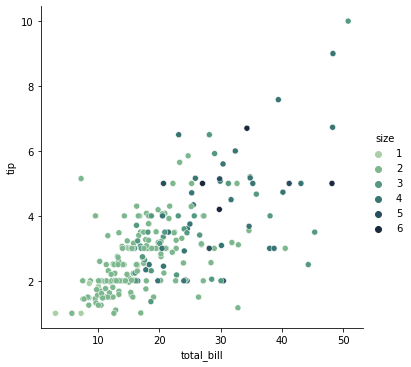

In [33]:
sns.relplot(x="total_bill", y="tip", hue="size", palette="ch:r=-.5,l=.75", data=tips);


Семантическая переменная третьего типа изменяет размер каждой точки:



In [ ]:
sns.relplot(x="total_bill", y="tip", size="size", data=tips);


В отличие от matplotlib.pyplot.scatter(), буквальное значение переменной не используется для выбора области точки. Вместо этого диапазон значений в единицах данных нормализуется до диапазона в единицах площади. Этот диапазон можно настроить:



In [ ]:
sns.relplot(x="total_bill", y="tip", size="size", sizes=(15, 200), data=tips);


###### Подчеркивание непрерывности с помощью линейных графиков 


Графики рассеяния очень эффективны, но не существует универсально оптимального типа визуализации. Вместо этого визуальное представление должно быть адаптировано к специфике набора данных и к вопросу, на который вы пытаетесь ответить с помощью графика.



С некоторыми наборами данных вы можете захотеть понимать изменения одной переменной как функцию времени или аналогичную непрерывную переменную. В этой ситуации хорошим выбором является построение линейного графика. В seaborn это может быть выполнено с помощью lineplot()функции либо напрямую, либо с relplot()помощью установки kind="line":



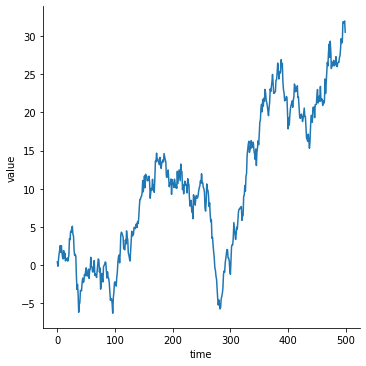

In [40]:
df = pd.DataFrame(dict(time=np.arange(500),
                       value=np.random.randn(500).cumsum()))
g = sns.relplot(x="time", y="value", kind="line", data=df)
plt.show()

Поскольку lineplot()предполагает, что вы чаще всего пытаетесь рисовать y как функцию x, поведение по умолчанию заключается в сортировке данных по x значениям перед построением графика. Однако это можно отключить:



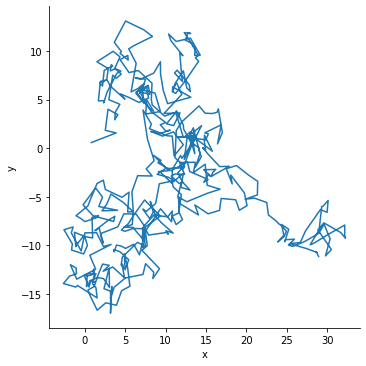

In [43]:
df = pd.DataFrame(np.random.randn(500, 2).cumsum(axis=0), columns=["x", "y"])
sns.relplot(x="x", y="y", sort=False, kind="line", data=df);

###### Агрегирование и представление неопределенности 


Более сложные наборы данных будут иметь несколько измерений для одного и того же значения x переменной. Поведение по умолчанию в seaborn заключается в объединении нескольких измерений для каждого x значения путем построения среднего значения и 95% доверительного интервала вокруг среднего значения:



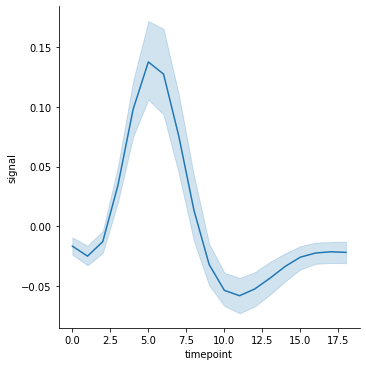

In [44]:
fmri = sns.load_dataset("fmri")
sns.relplot(x="timepoint", y="signal", kind="line", data=fmri);

Доверительные интервалы вычисляются с использованием начальной загрузки, которая может занять много времени для больших наборов данных. Поэтому их можно отключить:



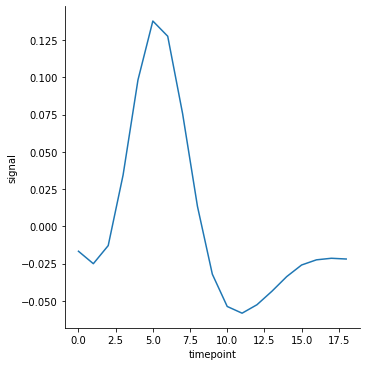

In [45]:
sns.relplot(x="timepoint", y="signal", ci=None, kind="line", data=fmri);


Еще один хороший вариант, особенно с большими данными, — представить разброс распределения в каждый момент времени путем построения стандартного отклонения вместо доверительного интервала:



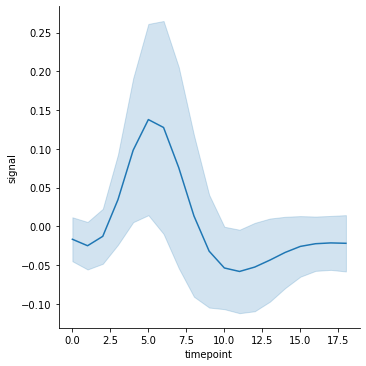

In [47]:
sns.relplot(x="timepoint", y="signal", kind="line", ci="sd", data=fmri);


Чтобы полностью отключить агрегирование, установите для estimator параметра значение None Это может привести к странному эффекту, если данные имеют несколько наблюдений в каждой точке.



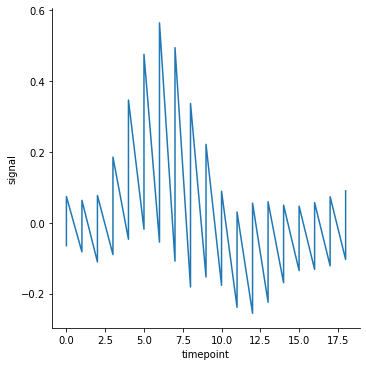

In [46]:
sns.relplot(x="timepoint", y="signal", estimator=None, kind="line", data=fmri);


###### Отображение подмножеств данных с помощью семантических отображений ¶


Функция lineplot()обладает той же гибкостью, что и scatterplot(): она может отображать до трех дополнительных переменных, изменяя оттенок, размер и стиль элементов графика. Это делается с использованием того же API scatterplot(), что и , а это означает, что нам не нужно останавливаться и думать о параметрах, которые контролируют внешний вид линий и точек в matplotlib.



Использование семантики lineplot()также определяет способ агрегирования данных. Например, добавление семантики оттенка с двумя уровнями разбивает график на две линии и полосы ошибок, окрашивая каждую, чтобы указать, какому подмножеству данных они соответствуют.



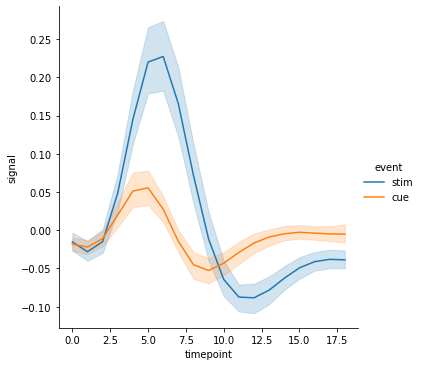

In [48]:
sns.relplot(x="timepoint", y="signal", hue="event", kind="line", data=fmri);


Добавление семантики стиля к линейному графику изменяет шаблон штрихов в линии по умолчанию:



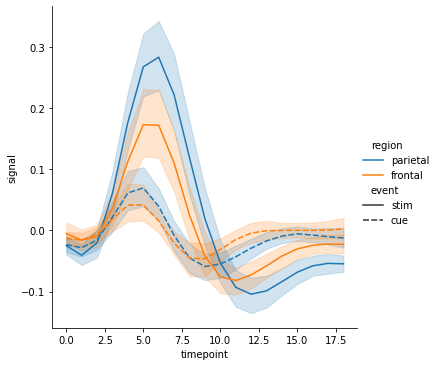

In [49]:
sns.relplot(x="timepoint", y="signal", hue="region", style="event",
            kind="line", data=fmri);

Но вы можете идентифицировать подмножества по маркерам, используемым при каждом наблюдении, либо вместе с черточками, либо вместо них:



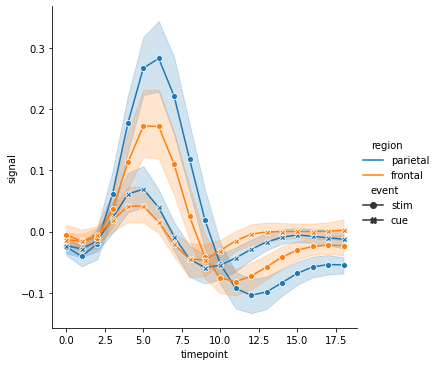

In [50]:
sns.relplot(x="timepoint", y="signal", hue="region", style="event",
            dashes=False, markers=True, kind="line", data=fmri);

###### Отображение нескольких графиков

 Поскольку relplot()он основан на FacetGrid, это легко сделать. Чтобы показать влияние дополнительной переменной, вместо того, чтобы отводить ей одну из смысловых ролей в сюжете, используйте ее для «фасетирования» визуализации. Это означает, что вы делаете несколько осей и наносите подмножества данных на каждую из них:

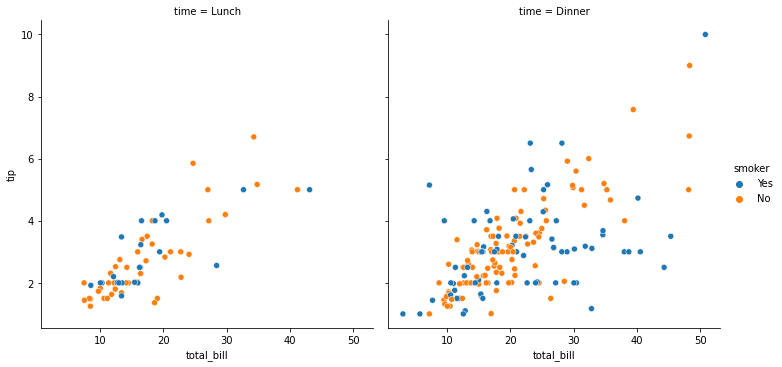

In [51]:
sns.relplot(x="total_bill", y="tip", hue="smoker",
            col="time", data=tips);

Вы также можете показать влияние двух переменных таким образом: одну, огранив столбцы, и одну, огранив строки. Когда вы начнете добавлять в сетку больше переменных, вы можете уменьшить размер фигуры. Помните, что размер FacetGrid определяется высотой и соотношением сторон каждой грани :



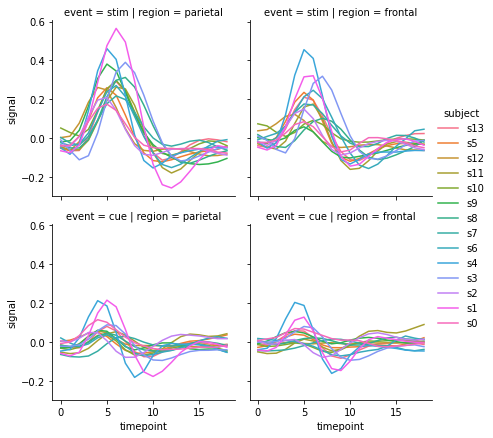

In [52]:
sns.relplot(x="timepoint", y="signal", hue="subject",
            col="region", row="event", height=3,
            kind="line", estimator=None, data=fmri);

In [ ]:
Если вы хотите изучить эффекты на многих уровнях переменной, может быть хорошей идеей фасетировать эту переменную в столбцы, а затем «обернуть» фасеты в строки:



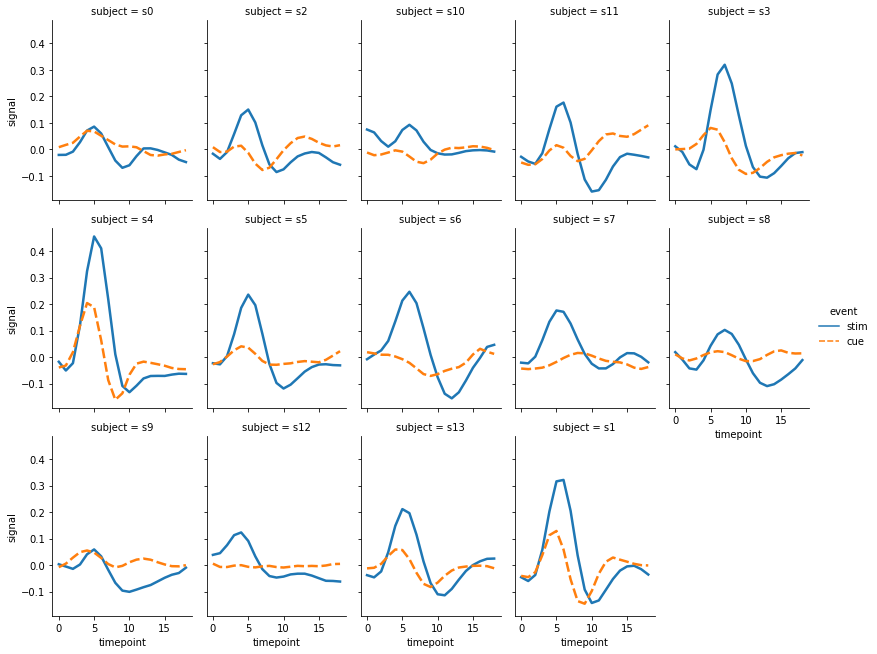

In [53]:
sns.relplot(x="timepoint", y="signal", hue="event", style="event",
            col="subject", col_wrap=5,
            height=3, aspect=.75, linewidth=2.5,
            kind="line", data=fmri.query("region == 'frontal'"));

Эти визуализации, которые часто называют «решетчатыми» графиками или «малыми кратными», очень эффективны, поскольку они представляют данные в формате, который позволяет глазу легко обнаруживать как общие закономерности, так и отклонения от этих закономерностей. Хотя вы должны использовать гибкость, обеспечиваемую scatterplot()и relplot(), всегда старайтесь помнить, что несколько простых графиков обычно более эффективны, чем один сложный график.

###### Еще немного примеров графиков

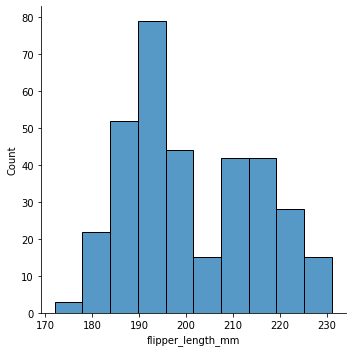

In [55]:
penguins = sns.load_dataset("penguins")
sns.displot(penguins, x="flipper_length_mm")

Набор данных о пингвинах архипелага Палмера (Антарктида), по-видимому, является заменой Ирисов. Это отличный вводной набор данных для исследования и визуализации данных.

https://www.kaggle.com/parulpandey/penguin-dataset-the-new-iris

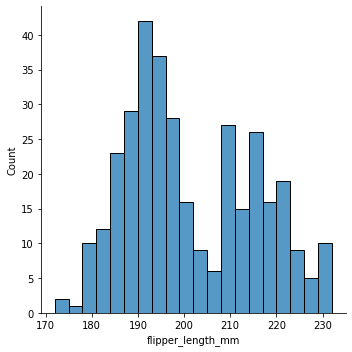

In [56]:
sns.displot(penguins, x="flipper_length_mm", binwidth=3)


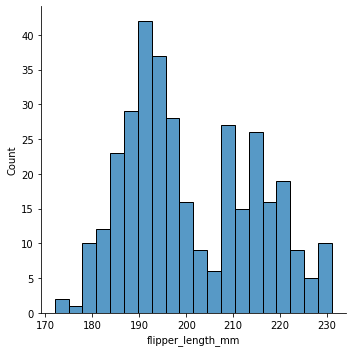

In [57]:
sns.displot(penguins, x="flipper_length_mm", bins=20)


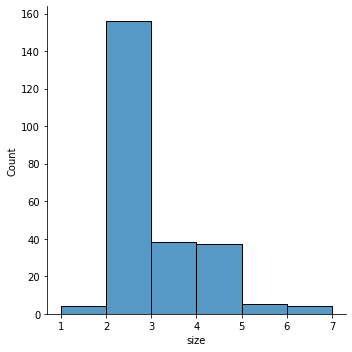

In [58]:
sns.displot(tips, x="size", bins=[1, 2, 3, 4, 5, 6, 7])

Этого также можно добиться, установив discrete=True, который выбирает разрывы бинов, представляющие уникальные значения в наборе данных, с столбцами, центр которых соответствует соответствующему значению.

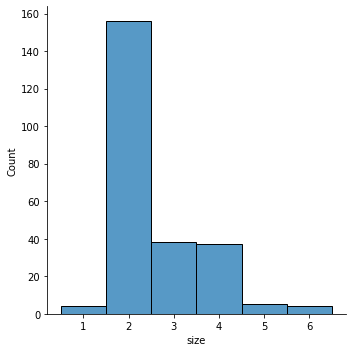

In [59]:
sns.displot(tips, x="size", discrete=True)


Также можно визуализировать распределение категориальной переменной, используя логику гистограммы. Дискретные интервалы автоматически устанавливаются для категориальных переменных, но также может быть полезно немного «сжать» столбцы, чтобы подчеркнуть категориальный характер оси:

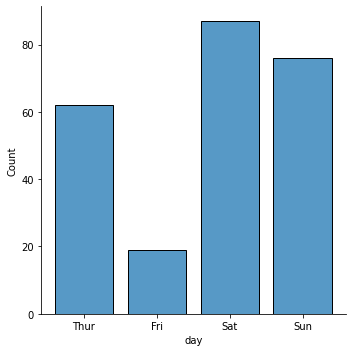

In [60]:
sns.displot(tips, x="day", shrink=.8)


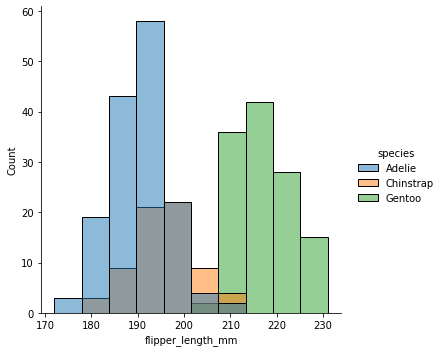

In [61]:
sns.displot(penguins, x="flipper_length_mm", hue="species")


По умолчанию разные гистограммы «накладываются» друг на друга, и в некоторых случаях их бывает трудно различить. Один из вариантов — изменить визуальное представление гистограммы с гистограммы на «ступенчатый» график:



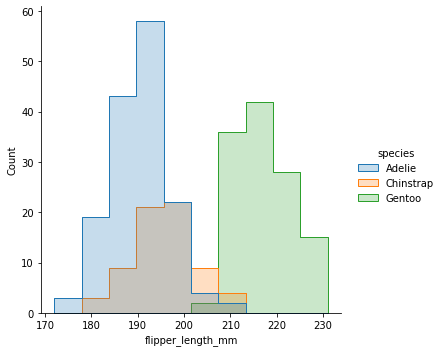

In [62]:
sns.displot(penguins, x="flipper_length_mm", hue="species", element="step")


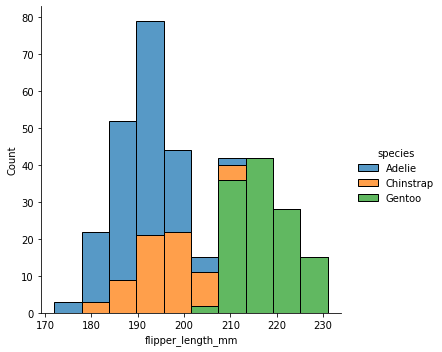

In [63]:
sns.displot(penguins, x="flipper_length_mm", hue="species", multiple="stack")


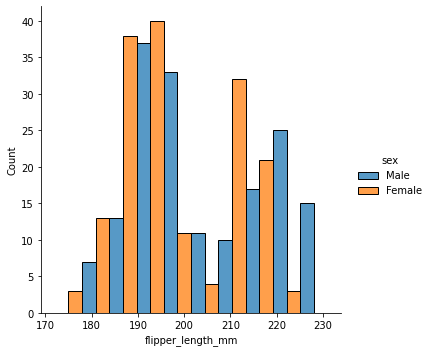

In [64]:
sns.displot(penguins, x="flipper_length_mm", hue="sex", multiple="dodge")


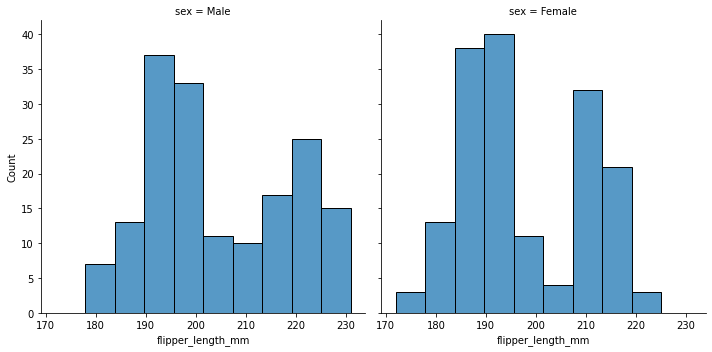

In [65]:
sns.displot(penguins, x="flipper_length_mm", col="sex")


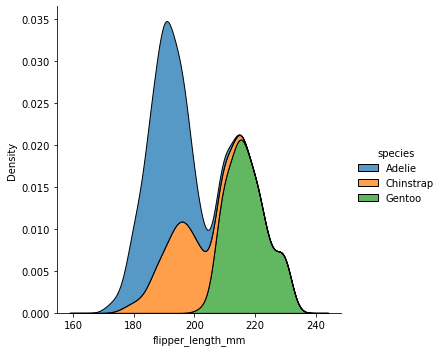

In [66]:
sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde", multiple="stack")


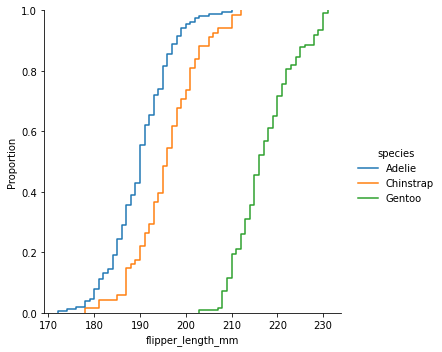

In [67]:
sns.displot(penguins, x="flipper_length_mm", hue="species", kind="ecdf")


###### Визуализация двумерных распределений ¶


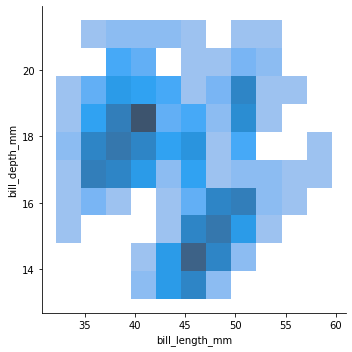

In [68]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm")


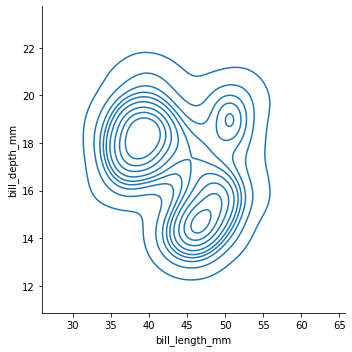

In [69]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", kind="kde")


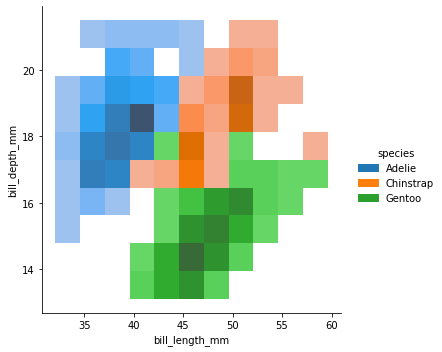

In [70]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", hue="species")


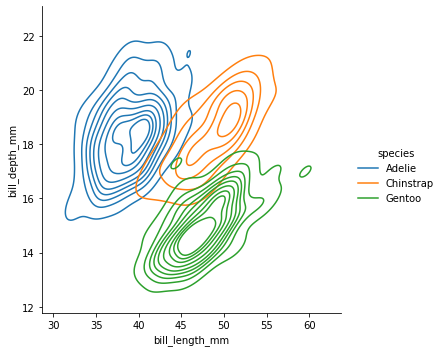

In [71]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", hue="species", kind="kde")


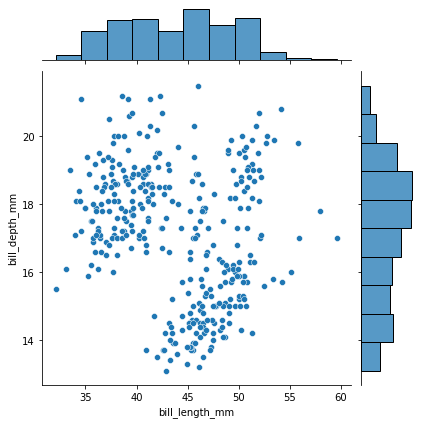

In [73]:
sns.jointplot(data=penguins, x="bill_length_mm", y="bill_depth_mm")


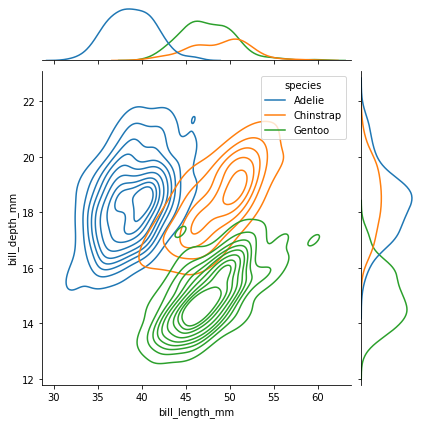

In [74]:
sns.jointplot(
    data=penguins,
    x="bill_length_mm", y="bill_depth_mm", hue="species",
    kind="kde"
)

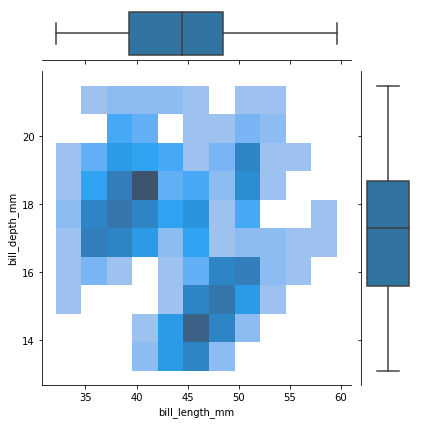

In [75]:
g = sns.JointGrid(data=penguins, x="bill_length_mm", y="bill_depth_mm")
g.plot_joint(sns.histplot)
g.plot_marginals(sns.boxplot)

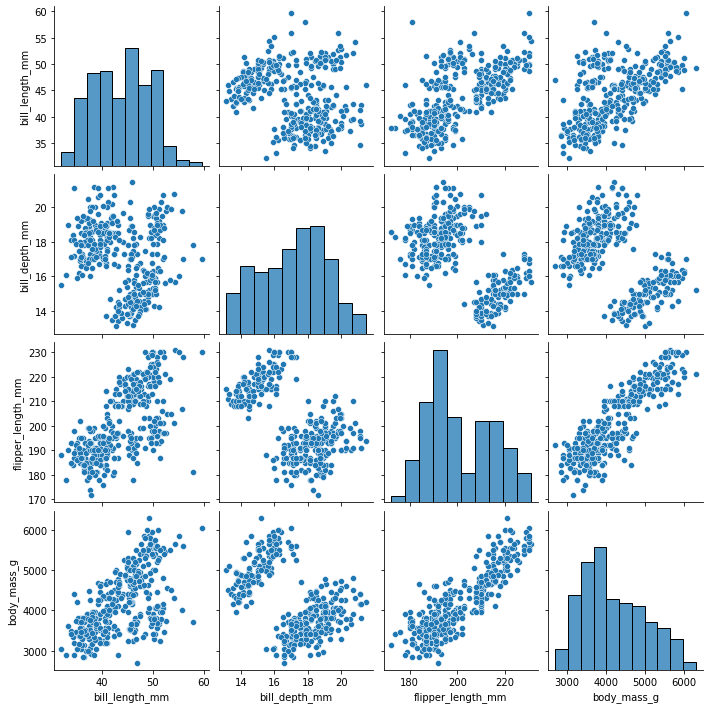

In [76]:
sns.pairplot(penguins)


## Plotly

Plotly — библиотека для визуализации данных, состоящая из нескольких частей:

    Front-End на JS
    Back-End на Python (за основу взята библиотека Seaborn)
    Back-End на R

Документация - https://plotly.com/graphing-libraries/

Так же на базе plotly и веб-сервера Flask существует специальная библиотека для создания дашбордов Dash - https://dash.plotly.com/m

Plotly - бесплатная библиотека, которую вы можете использовать в коммерческих целях

Plotly работает offline

Plotly позволяет строить интерактивные визуализации

Т.е. с помощью Plotly можно как изучать какие-то данные "на лету" (не перестраивая график в matplotlib, изменяя масштаб, включая/выключая какие-то данные), так и построить полноценный интерактивный отчёт (дашборд).



Для начала необходимо установить библиотеку, т.к. она не входит ни в стандартный пакет, ни в Anaconda. Для этого рекомендуется использовать pip:



In [78]:
!pip install plotly


You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.


Перед началом работы необходимо импортировать модуль. В разных частях нашего занятия для разных задач нам понадобятся как основной модуль, так и один из его подмодулей, поэтому полный набор инструкций импорта у нас:



In [79]:
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

###### Линейный график


Начнём с простой задачи построения графика по точкам.

Используем функцию  $$f(x) = x^2$$


Сперва поступим совсем просто и "в лоб":

Создадим график с помощью функции scatter из подмодуля plotly.express (внутрь передадим 2 списка точек: координаты X и Y)

Тут же "покажем" его с помозью метода show()

Обратите внимание - график интерактивный, если навести на него курсор, то можно его приближать и удалять, выделять участки, по наведению курсора на точку получать подробную информацию, возвращать картинку в исходное положение, а при необходимости "скриншотить" и сохранять как файл.

Всё это делается с помощью JS в вашем браузере. А значит, при желании вы можете этим управлять уже после построения фигуры (но мы этого делать пожалуй не будем, т.к. JS != Python)

In [81]:
x = np.arange(0, 5, 0.1)
def f(x):
    return x**2

px.scatter(x=x, y=f(x)).show()

Более читабельно и правильно записать тот же в код в следующем виде:



In [83]:
fig = px.scatter(x=x, y=f(x))
fig.show()

    Создаём фигуру
    Рисуем график
    Показываем фигуру

2 строчки и готовый результат. Т.к. мы используем Express. Быстро и просто.



Но маловато гибкости

In [82]:
fig = go.Figure()
#Здесь будет код
fig.show()

Чтобы добавить что на график нам понадобится метод фигуры add_trace.



fig.add_trace(ТУТ_ТО_ЧТО_ХОТИМ_ПЕРЕДАТЬ_ДЛЯ_ОТОБРАЖЕНИЯ_И_ГДЕ)



Но ЧТО мы хотим нарисовать? График по точкам. График мы уже рисовали с помощью Scatter в Экспрессе, у Объектов есть свой Scatter, давайте глянем что он делает:



In [84]:
go.Scatter(x=x, y=f(x))



Scatter({
    'x': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
                1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7,
                2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4. , 4.1,
                4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9]),
    'y': array([0.000e+00, 1.000e-02, 4.000e-02, 9.000e-02, 1.600e-01, 2.500e-01,
                3.600e-01, 4.900e-01, 6.400e-01, 8.100e-01, 1.000e+00, 1.210e+00,
                1.440e+00, 1.690e+00, 1.960e+00, 2.250e+00, 2.560e+00, 2.890e+00,
                3.240e+00, 3.610e+00, 4.000e+00, 4.410e+00, 4.840e+00, 5.290e+00,
                5.760e+00, 6.250e+00, 6.760e+00, 7.290e+00, 7.840e+00, 8.410e+00,
                9.000e+00, 9.610e+00, 1.024e+01, 1.089e+01, 1.156e+01, 1.225e+01,
                1.296e+01, 1.369e+01, 1.444e+01, 1.521e+01, 1.600e+01, 1.681e+01,
                1.764e+01, 1.849e+01, 1.936e+01, 2.025e+01, 2.116e+01, 2.209e+01,
                2.

А теперь объединим:



In [86]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.show()

Как видим, отличия не только в коде, но и в результате - получилась гладкая кривая.

Кроме того, такой способ позволит нам нанести на график столько кривых, сколько мы хотим:

In [89]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x)))
fig.add_trace(go.Scatter(x=x, y=x*2))
fig.show()

###### Подписи графиков



Добавим атрибут name, в который передадим строку с именем графика, которое мы хотим отображать в легенде.

Plotly поддерживает LATEX в подписях (аналогично matplotlib через использование $$ с обеих сторон).

$$f(x) = x^2$$

In [90]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), name='$$f(x)=x^2$$'))
fig.add_trace(go.Scatter(x=x, y=x, name='$$g(x)=x$$'))
fig.show()

In [ ]:
К сожалению, это имеет свои ограничения, как можно заметить подсказка при наведении на график отображается в "сыром" виде, а не в LATEX.



In [ ]:
Победить это можно, если использовать HTML разметку в подписях. В данном примере я буду использовать тег sup. Так же заметьте, что шрифт для LATEX и HTML отличается начертанием.



In [91]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='$$g(x)=x$$'))
fig.show()

С увеличением длины подписи графика, легенда начала наезжать на график. Мне это не нравится, поэтому перенесём легенду вниз.

Для этого применим к фигуре метод update_layout, у которого нас интересует атрибут legend_orientation fig.update_layout(legend_orientation="h")

In [93]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='$$g(x)=x$$'))
fig.update_layout(legend_orientation="h")
fig.show()

In [94]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x),  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, name='$$g(x)=x$$'))
fig.update_layout(legend_orientation="h", 
                  margin=dict(l=0, r=0, t=0, b=0))
fig.show()

In [95]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers', name='$$g(x)=x$$'))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="x+y")
fig.show()

In [96]:
fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5])
fig.update_xaxes(range=[-0.5, 1.5])
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [97]:
fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink')
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000')
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [98]:
def h(x):
    return np.sin(x)

def k(x):
    return np.cos(x)

def m(x):
    return np.tan(x)


fig = go.Figure()
fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink')
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000')

fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'))

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'))
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))))
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [99]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Plot 1", "Plot 2"))

fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 1, 1)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 1, 1)
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 1, 2)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 1, 2)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=40, b=0))
fig.update_layout(title="Plot Title")
fig.update_xaxes(title='Ось X графика 1', col=1, row=1)
fig.update_xaxes(title='Ось X графика 2', col=2, row=1)
fig.update_yaxes(title='Ось Y графика 1', col=1, row=1)
fig.update_yaxes(title='Ось Y графика 2', col=2, row=1)
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [100]:
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None], [{}, {}]])


fig.update_yaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='LightPink', col=2)
fig.update_xaxes(range=[-0.5, 1.5], zeroline=True, zerolinewidth=2, zerolinecolor='#008000', col=2)

fig.add_trace(go.Scatter(x=x, y=h(x),  name='h(x)=sin(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=k(x),  name='k(x)=cos(x)'), 2, 2)
fig.add_trace(go.Scatter(x=x, y=m(x),  name='m(x)=tg(x)'), 1, 1)

fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>'), 2, 1)
fig.add_trace(go.Scatter(x=x, y=x, mode='markers',name='g(x)=x',
                         marker=dict(color='LightSkyBlue', size=20, line=dict(color='MediumPurple', width=3))), 2, 1)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [101]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>', 
                         marker=dict(color=h(x), colorbar=dict(title="h(x)=sin(x)"))
                        ))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [102]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=f(x), mode='lines+markers',  name='f(x)=x<sup>2</sup>', 
                         marker=dict(color=h(x), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno')
                        ))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=h(x),  name='h(x)=sin(x)'))
fig.add_trace(go.Scatter(visible='legendonly', x=x, y=k(x),  name='k(x)=cos(x)'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

###### Анимация

Мы будем анимировать график построения параболы. Для этого нам понадобятся:

    Начальное состояние

    Кнопки (анимация не должна начинаться сама по себе, поэтому для начала мы создадим простую кнопку, её запускающую, а постепенно перейдём к временной шкале)

    Фреймы (или кадры) - промежуточные состояния

In [104]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()


Код минимальной работоспособной кнопки выглядит так:

"updatemenus": [{"type": "buttons",
                 "buttons": [{"label": "Your Label",
                              "method": "animate",
                              "args": [See Below]}]}]

updatemenus - это один из элементов слоя, т.е. layout фигуры, а значит, мы добавим кнопку с помощью метода update_layout.



In [105]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

Пока она не будет ничего делать, т.к. у нас нечего анимировать.



In [ ]:
Фреймы

Это список "кадров" из которых состоит наша анимация.

Каждый фрейм должен содержать внутри себя целиком готовый график, который просто будет отображаться на нашей фигуре, как в декорациях.

Фрейм создаётся с помощью go.Frame()

График передаётся внутрь фрейма в аргумент data.

Таким образом, если мы хотим построить последовательность графиков (от 1 точки до целой фигуры), нам надо просто пройти в цикле:

In [107]:
frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i], y=f(x[:i]))]))

После этого фреймы необходимо передать в фигуру. У каждой фигуры есть атрибут frames, который мы и будем использовать:


In [108]:
fig.frames = frames



In [109]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>'))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [ ]:
Другой способ задать начальное состояние, слой (с кнопками) и фреймы - сразу передать всё в объект go.Figure:



In [111]:
frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]))]))
    
    
fig = go.Figure(data=go.Scatter(x=[x[0]], y=[f(x[0])], mode='lines+markers',  name='f(x)=x<sup>2</sup>'),
                frames=frames,
                layout=dict(legend_orientation="h",
                            legend=dict(x=.5, xanchor="center"),
                            updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                            margin=dict(l=0, r=0, t=0, b=0)))

fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [ ]:
Естественно, если добавить на графики (как на начальный, так и те, что во фреймах) маркеры с указанием цвета, цветовой шкалы и размера, то анимация будет более сложного графика.



In [112]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[x[0]], y=[f(x)[0]], mode='lines+markers',  name='f(x)=x<sup>2</sup>',
                         marker=dict(color=h(x[0]), colorbar=dict(title="h(x)=sin(x)"), colorscale='Inferno', size=50*abs(h(x[0])))
                        ))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(x=x[:i+1], y=f(x[:i+1]), marker=dict(color=h(x[:i+1]), size=50*abs(h(x[:i+1]))))]))

fig.frames = frames   

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])],
                  margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(hoverinfo="all", hovertemplate="Аргумент: %{x}<br>Функция: %{y}")
fig.show()

In [113]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[f(x)[0]], mode='lines+markers', name='f(x)=x<sup>2</sup>')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=f(x[:i+1]), mode='lines+markers', name='f(x)=x<sup>2</sup>'))

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    # Hide all traces
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    # Enable trace we want to see
    step['args'][1][i] = True
    
    # Add step to step list
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.layout.sliders = sliders

fig.show()

In [114]:
num_steps = len(x)
trace_list = [go.Scatter(visible=True, x=[x[0]], y=[h(x)[0]], mode='lines+markers', name='h(x)=sin(x)'),
              go.Scatter(visible=True, x=[x[0]], y=[k(x)[0]], mode='lines+markers', name='k(x)=cos(x)')]

for i in range(1, len(x)):
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'))
    trace_list.append(go.Scatter(visible=False, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)'))

frames=[]
for i in range(1, len(x)):
    frames.append(go.Frame(data=[go.Scatter(visible=True, x=x[:i+1], y=h(x[:i+1]), mode='lines+markers', name='h(x)=sin(x)'),
                                 go.Scatter(visible=True, x=x[:i+1], y=k(x[:i+1]), mode='lines+markers', name='k(x)=cos(x)')])) 

fig = go.Figure(data=trace_list)

steps = []
for i in range(num_steps):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(fig.data)],
    )
    step['args'][1][2*i] = True
    step['args'][1][2*i+1] = True
    steps.append(step)

sliders = [dict(
    steps = steps,
)]

fig.update_layout(updatemenus=[dict(direction="left", x=0.5, xanchor="center", y=0,
                                    type="buttons", buttons=[dict(label="▶", method="animate", args=[None, {"fromcurrent": True}]),
                                                             dict(label="❚❚", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                                                                                               "mode": "immediate",
                                                                                                               "transition": {"duration": 0}}])])],
                  )


fig.layout.sliders = sliders
fig.frames = frames  

fig.show()

In [115]:
cities = pd.read_csv('https://raw.githubusercontent.com/hflabs/city/master/city.csv')
fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], lon=cities['geo_lon']))
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [118]:
def to_int_size(value):
    try:
        return np.log10(int(value))
    except:
        return np.log10(int(value.split('[')[0]))

fig = go.Figure(go.Scattermapbox(lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(size=cities['population'].map(to_int_size))))
map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))
fig.show()
train_russia = pd.read_csv('https://gist.githubusercontent.com/lexnekr/2da07b5fc12b5be24068e4d68ed47ca5/raw/d6256765a3223282fbfec7e0b040cbfb21593fff/train_russia.scv')

fig = go.Figure(go.Scattermapbox(legendgroup="group",
                                 name='Города России',
                                 lat=cities['geo_lat'], 
                                 lon=cities['geo_lon'], 
                                 text=cities['city'],
                                 marker=dict(colorbar=dict(title="Год основания"),
                                             color=cities['foundation_year'].map(to_int_year),
                                             size=cities['population'].map(to_int_size))))

for df_for_today in train_russia.groupby(['day number']):
    fig.add_trace(go.Scattermapbox(name='День {}'.format(df_for_today[0]),
                                   mode = "lines",
                                   hoverinfo='skip',
                                   lat=df_for_today[1]['geo_lat'],
                                   lon=df_for_today[1]['geo_lon']))    

map_center = go.layout.mapbox.Center(lat=(cities['geo_lat'].max()+cities['geo_lat'].min())/2, 
                                     lon=(cities['geo_lon'].max()+cities['geo_lon'].min())/2)
fig.update_layout(title='По России на поезде',
                  legend_orientation="h",
                  mapbox_style="open-street-map",
                  mapbox=dict(center=map_center, zoom=2))

fig.show()

https://habr.com/ru/post/502958/

https://github.com/lexnekr/plotly_lesson/blob/master/plotly_lesson.ipynb

## BOKEH

Основная концепция Bokeh заключается в том, что графики строятся по одному слою за раз. Мы начинаем с создания фигуры, а затем добавляем элементы, называемыеглифы, к рисунку. (Для тех, кто использовал ggplot, идея глифов по сути та же, что и у геом, которые добавляются к графу по одному «слою» за раз.) Глифы могут принимать множество форм в зависимости от желаемого использования: круги, линии , патчи, бары, дуги и так далее. Давайте проиллюстрируем идею глифов, сделав базовую диаграмму с квадратами и кругами. Во-первых, мы строим сюжет, используяfigureметод, а затем мы добавляем наши глифы к графику, вызывая соответствующий метод и передавая данные. Наконец, мы показываем наш график 

In [128]:
!pip install bokeh

     |████████████████████████████████| 18.5 MB 537 kB/s eta 0:00:01
You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.


In [129]:
# bokeh basics
from bokeh.plotting import figure
from bokeh.io import show, output_notebook

# Create a blank figure with labels
p = figure(plot_width = 600, plot_height = 600, 
           title = 'Example Glyphs',
           x_axis_label = 'X', y_axis_label = 'Y')

# Example data
squares_x = [1, 3, 4, 5, 8]
squares_y = [8, 7, 3, 1, 10]
circles_x = [9, 12, 4, 3, 15]
circles_y = [8, 4, 11, 6, 10]

# Add squares glyph
p.square(squares_x, squares_y, size = 12, color = 'navy', alpha = 0.6)
# Add circle glyph
p.circle(circles_x, circles_y, size = 12, color = 'red')

# Set to output the plot in the notebook
output_notebook()
# Show the plot
show(p)

Loading BokehJS ...

In [132]:
import numpy as np

from bokeh.layouts import gridplot
from bokeh.plotting import figure, output_file, show

N = 100
x = np.linspace(0, 4*np.pi, N)
y0 = np.sin(x)


sine = figure(width=500, plot_height=500, title='Sine')
sine.circle(x, y0, size=10, color="navy", alpha=0.5)

p = gridplot([[sine]], toolbar_location=None)

show(p)

https://chel-center.ru/python-yfc/2021/01/11/bokeh-nbsp-mdash-interaktivnaya-infografika-na-python/

## Статическая динамика

###### Ipywidgets

In [134]:
!pip install ipympl

     |████████████████████████████████| 507 kB 1.4 MB/s eta 0:00:01
You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.


In [135]:
%matplotlib widget
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np

In [136]:
def say_my_name(name):
    """
    Print the current widget value in short sentence
    """
    print(f'My name is {name}')
     
widgets.interact(say_my_name, name=["Jim", "Emma", "Bond"]);

interactive(children=(Dropdown(description='name', options=('Jim', 'Emma', 'Bond'), value='Jim'), Output()), _…

In [137]:

def say_something(x):
    """
    Print the current widget value in short sentence
    """
    print(f'Widget says: {x}')
 
widgets.interact(say_something, x=[0, 1, 2, 3])
widgets.interact(say_something, x=(0, 10, 1))
widgets.interact(say_something, x=(0, 10, .5))
_ = widgets.interact(say_something, x=True)

interactive(children=(Dropdown(description='x', options=(0, 1, 2, 3), value=0), Output()), _dom_classes=('widg…

interactive(children=(IntSlider(value=5, description='x', max=10), Output()), _dom_classes=('widget-interact',…

interactive(children=(FloatSlider(value=5.0, description='x', max=10.0, step=0.5), Output()), _dom_classes=('w…

interactive(children=(Checkbox(value=True, description='x'), Output()), _dom_classes=('widget-interact',))

https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20Basics.html

In [140]:
from ipywidgets import *
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

x = np.linspace(0, 2 * np.pi)

def update(w = 1.0):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(x, np.sin(w * x))

    fig.canvas.draw()

interact(update);

interactive(children=(FloatSlider(value=1.0, description='w', max=3.0, min=-1.0), Output()), _dom_classes=('wi…

In [144]:

from sklearn.datasets import load_iris

iris = load_iris()

iris_df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_df["FlowerType"] = iris.target #[iris.target_names[t] for t in iris.target]

iris_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),FlowerType
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [145]:
def create_scatter(feature1, feature2):
    with plt.style.context("ggplot"):
        fig = plt.figure(figsize=(8,4))

        plt.scatter(x = iris_df[feature1],
                    y = iris_df[feature2],
                    c=iris_df["FlowerType"],
                    s=20
                   )

        plt.xlabel(feature1.capitalize())
        plt.ylabel(feature2.capitalize())

        plt.title("%s vs %s"%(feature1.capitalize(), feature2.capitalize()))

In [146]:
widgets.interact(create_scatter, feature1=iris.feature_names, feature2=iris.feature_names);


interactive(children=(Dropdown(description='feature1', options=('sepal length (cm)', 'sepal width (cm)', 'peta…

In [148]:
def f(x):
    return f"The selected value is '{x}'"

widgets.interact(f, x=10)

interactive(children=(IntSlider(value=10, description='x', max=30, min=-10), Output()), _dom_classes=('widget-…

<function __main__.f(x)>

In [ ]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [151]:
iris_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),FlowerType
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [160]:
parametrs=iris_df.columns.to_list()

In [161]:
parametrs

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)',
 'FlowerType']

In [166]:
def simpleplot(Параметр):
    df=iris_df
    df[[Параметр]].plot()        
interact(simpleplot,  Параметр=parametrs)


interactive(children=(Dropdown(description='Параметр', options=('sepal length (cm)', 'sepal width (cm)', 'peta…

<function __main__.simpleplot(Параметр)>

In [169]:
def norm(x, Параметр1, Параметр2):
    
    dat1 = iris_df[[Параметр1, Параметр2,]]
    dat1.plot()
    dat1_norm = (dat1 - dat1.mean()) / (dat1.max() - dat1.min())
    dat2 = dat1_norm.rolling(x, win_type="triang").sum()
    dat2.plot() 
        
interact(norm, x=(1, 100),  Параметр1=parametrs, Параметр2=parametrs)

interactive(children=(IntSlider(value=50, description='x', min=1), Dropdown(description='Параметр1', options=(…

<function __main__.norm(x, Параметр1, Параметр2)>

In [171]:
def corrmap(Параметр1, Параметр2, Параметр3, Параметр4, Параметр5, Параметр6):
    df=iris_df
    dfn=df[[Параметр1, Параметр2, Параметр3, Параметр4, Параметр5, Параметр6]]
    corr = dfn.corr()
    sns.heatmap(
    corr, 
    xticklabels=corr.columns.values, 
    yticklabels=corr.columns.values);

interact(corrmap,  Параметр1=parametrs, Параметр2=parametrs, Параметр3=parametrs, Параметр4=parametrs, Параметр5=parametrs, Параметр6=parametrs)

interactive(children=(Dropdown(description='Параметр1', options=('sepal length (cm)', 'sepal width (cm)', 'pet…

<function __main__.corrmap(Параметр1, Параметр2, Параметр3, Параметр4, Параметр5, Параметр6)>

## Clustergram

пакет Python для генерации кластерограмм из решений кластеризации. Библиотека была разработана в рамках исследовательского проекта Urban Grammar и совместима со scikit-learn и библиотеками с поддержкой GPU, такими как cuML или cuDF в рамках RAPIDS.AI.ь

Когда мы хотим провести кластерный анализ для выявления групп в наших данных, мы часто используем алгоритмы типа метода k-средних, которые требуют задания количества кластеров. Но проблема в том, что мы обычно не знаем, сколько кластеров существует.



Существует множество методов определения правильного числа, например силуэты или локтевой сгиб. Но они обычно не дают представления о том, что происходит между различными вариантами, поэтому цифры немного абстрактны.



Маттиас Шонлау предложил другой подход — кластерограмму. Кластерограмма — это двухмерный график, отражающий потоки наблюдений между классами по мере добавления кластеров. Это говорит вам о том, как перетасовываются ваши данные и насколько хороши ваши сплиты. Тал Галили позже реализовал кластерограмму для k-средних в R. Автор использовал реализацию Таля, перенёс ее на Python и создал clustergram — пакет Python для создания кластерограмм.

clustergram в настоящее время поддерживает метод k-средних, использование scikit-learn (включая реализацию Mini-Batch) и RAPIDS.AI cuML (если у вас есть GPU с поддержкой CUDA), Gaussian Mixture Model (только scikit-learn) и иерархическую кластеризацию на основе scipy.hierarchy. В качестве альтернативы мы можем создать кластерограмму на основе меток и данных, полученных с помощью альтернативных пользовательских алгоритмов кластеризации. Пакет предоставляет API, подобный sklearn, и строит кластерные диаграммы с помощью matplotlib, что даёт ему широкий выбор вариантов оформления в соответствии со стилем вашей публикации.



In [122]:
!pip install clustergram
!pip install urbangrammar_graphics 


You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 19.2 MB 7.3 MB/s eta 0:00:01
     |████████████████████████████████| 118 kB 9.6 MB/s eta 0:00:01
You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.


В любом случае вам нужно установить выбранный бэкенд (scikit-learn и scipy или cuML).



In [123]:
from clustergram import Clustergram
import urbangrammar_graphics as ugg
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale

sns.set(style='whitegrid')

Text(0.5, 1.01, 'Iris flowers')

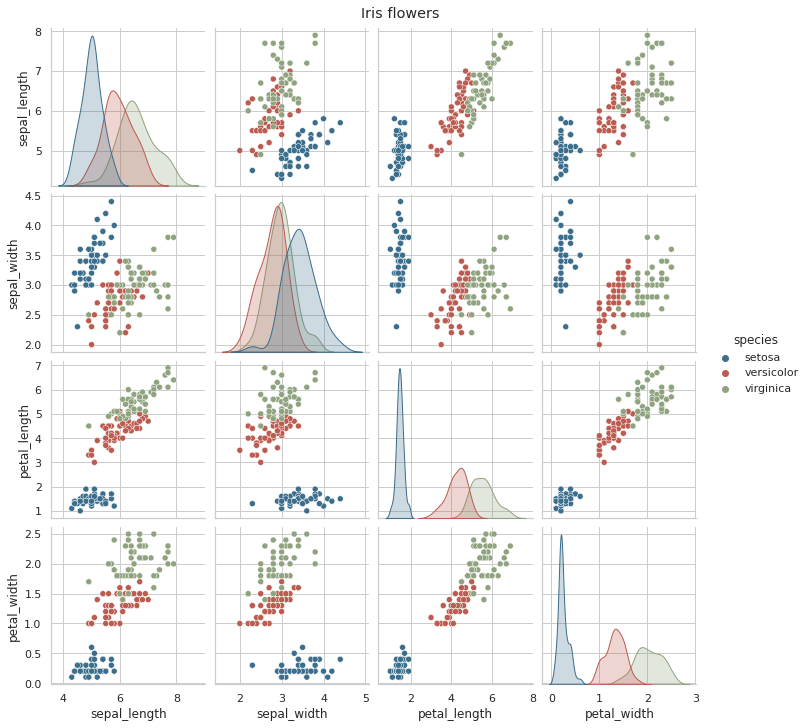

In [124]:
iris = sns.load_dataset("iris")
g = sns.pairplot(iris, hue="species", palette=ugg.COLORS[1:4])
g.fig.suptitle("Iris flowers", y=1.01)

Похоже, что setosa — относительно чётко определённая группа, тогда как разница между versicolor и virginica меньше, поскольку они частично перекрываются (или, в случае ширины чашелистика, полностью).



Итак, мы знаем, как выглядят данные. Теперь мы можем увидеть кластерограмму. Помните, мы знаем, что существует три кластера, и в идеале мы должны быть в состоянии распознать это по кластерограмме. Я говорю “в идеале”, потому что, даже если есть известные метки, это не значит, что наши данные или метод кластеризации способны различать эти классы.



Давайте начнём с кластеризации методом k-средних. Чтобы получить стабильный результат, мы можем запустить кластерную программу с 1000 инициализаций.



K=1 skipped. Mean computed from data directly.
K=2 fitted in 1.718984603881836 seconds.
K=3 fitted in 2.107551336288452 seconds.
K=4 fitted in 2.5444560050964355 seconds.
K=5 fitted in 2.9225363731384277 seconds.
K=6 fitted in 3.1496422290802 seconds.
K=7 fitted in 3.3916709423065186 seconds.
K=8 fitted in 3.739658832550049 seconds.
K=9 fitted in 4.136952638626099 seconds.


Text(0.5, 1.0, 'K-Means (scikit-learn)')

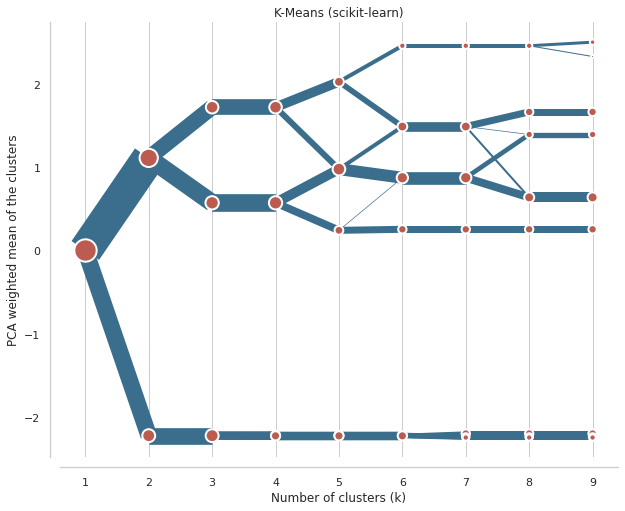

In [125]:
data = scale(iris.drop(columns=['species']))

cgram = Clustergram(range(1, 10), n_init=1000)
cgram.fit(data)

ax = cgram.plot(
    figsize=(10, 8),
    line_style=dict(color=ugg.COLORS[1]),
    cluster_style={"color": ugg.COLORS[2]},
)
ax.yaxis.grid(False)
sns.despine(offset=10)
ax.set_title('K-Means (scikit-learn)')

На оси x мы видим количество кластеров. Точки представляют собой центр каждого кластера (по умолчанию), взвешенный по первой главной компоненте (это помогает сделать диаграмму более читабельной). Линии, соединяющие точки, и их толщина представляют наблюдения, перемещающиеся между кластерами. Поэтому мы можем прочитать, когда новые кластеры образуются как расщепление одного существующего класса и когда они образуются на основе наблюдений из двух кластеров.



Мы ищем разделение, т. е. отвечаем на вопрос, принёс ли дополнительный кластер какое-либо значимое разделение? Шаг от одного кластера к двум большой — хорошее и чёткое разделение. От двух до трёх — свидетельство довольно хорошего раскола в верхней ветви. Но с 3 по 4 видимой разницы нет, потому что новый четвёртый кластер почти не отличается от существующей нижней ветви. Хотя сейчас она разделена на две части, это разделение не даёт нам много информации. Таким образом, можно сделать вывод, что идеальное количество кластеров для данных Iris — три.



# Гиперпараметры

Гиперпараметры (HP) - это те параметры, которые машинные алгоритмы или алгоритмы глубокого обучения не могут выучить в процессе обучения. Значение этих параметров должно быть установлено до процесса обучения, и оно может контролировать, как алгоритм учится на основе данных. Гиперпараметрами (HP) могут быть число слоев или нейронная сеть или количество узлов в слое, это может быть скорость обучения или тип оптимизатора, который может использовать нейронная сеть. Получение правильных гиперпараметров может быть нелогичным, это скорее процесс проб и ошибок. Следовательно, нам необходимо найти способ автоматической настройки этих параметров, чтобы получить наилучшую комбинацию, которая максимизирует производительность модели ML.



###### Цель функции:


Чтобы разработать функцию оценки улучшения, нам нужны формальные показатели того, насколько хороши или плохи наши модели. В машинном обучении мы называем эти «целевые функции». Наиболее распространенная целевая функция - это квадратичная ошибка, которая, по сути, является разницей между прогнозируемым значением и фактическим истинным значением. Если это значение велико, то точность низкая. Нашей целью от оптимизации гиперпараметров будет минимизация этой целевой функции. Правильное сочетание гиперпараметров модели может в значительной степени повлиять на производительность модели. Давайте посмотрим, как мы можем настроить эти параметры для минимизации целевой функции:

    Ручной поиск
    Случайный поиск
    Grid Search
    Автоматическая настройка гиперпараметров (Байесовская оптимизация, генетические алгоритмы)

###### Обнаружение мошенничества с кредитными картами

Наша цель - правильно классифицировать, какие транзакции по кредитным картам должны быть помечены как мошеннические или подлинные (двоичная классификация). Этот набор данных был анонимизирован перед распространением, поэтому значение большинства функций не было раскрыто.

In [184]:
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

In [181]:
ls DATA

'Online Retail.xlsx'*   creditcard.csv*   tips.csv*
 athletes_sochi.txt*    iris.csv*


In [186]:
df=pd.read_csv('DATA/creditcard.csv')

In [187]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [188]:
print(df.shape)
print(df.columns)

(284807, 31)
Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')


In [202]:
df=df[:1000]

Прежде всего, нам нужно разделить наш набор данных на обучающие и тестовые наборы.



In [203]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X = df[['V17', 'V9', 'V6', 'V12']]
Y = df['Class']

X = StandardScaler().fit_transform(X)

X_Train, X_Test, Y_Train, Y_Test = train_test_split(X, Y, test_size = 0.30, 
                                                    random_state = 101)

мы будем использовать классификатор случайных лесов в качестве нашей модели для оптимизации.

Модели случайных лесов состоят из большого количества некоррелированных деревьев решений, которые вместе образуют ансамбль. В случайном лесу каждое дерево решений делает свой собственный прогноз, и общий результат модели выбирается так, чтобы он отображался чаще всего.

Теперь мы можем начать с расчета точности нашей базовой модели.

In [206]:
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

model = RandomForestClassifier(random_state= 101).fit(X_Train,Y_Train)
predictionforest = model.predict(X_Test)
print(confusion_matrix(Y_Test,predictionforest))
print(classification_report(Y_Test,predictionforest))
acc1 = accuracy_score(Y_Test,predictionforest)

[[300]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       300

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300



Использование классификатора случайного леса со стандартными параметрами scikit-learn приводит к общей точности 95%. Посмотрим теперь, если применить некоторые методы оптимизации, мы сможем добиться большей точности.



## Ручной поиск


При использовании ручного поиска мы выбираем некоторые гиперпараметры на основе нашего суждения / опыта. Затем мы обучаем модель, оцениваем ее точность и запускаем процесс заново. Этот цикл повторяется до достижения удовлетворительной точности.



Основные параметры, используемые классификатором случайного леса:



    критерий= функция, используемая для оценки качества разделения.
    Максимальная глубина= максимально допустимое количество уровней в каждом дереве.
    max_features= максимальное количество объектов, учитываемых при разбиении узла.
    min_samples_leaf= минимальное количество образцов, которые могут храниться в листе дерева.
    min_samples_split= минимальное количество выборок, необходимое в узле, чтобы вызвать расщепление узла.
    n_estimators= количество деревьев в ансамбле.

Более подробную информацию о параметрах Random Forest можно найти https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

В качестве примера ручного поиска я попытался указать количество оценок в нашей модели. К сожалению, это не привело к улучшению точности.



In [207]:
model = RandomForestClassifier(n_estimators=10, random_state= 101).fit(X_Train,Y_Train)
predictionforest = model.predict(X_Test)
print(confusion_matrix(Y_Test,predictionforest))
print(classification_report(Y_Test,predictionforest))
acc2 = accuracy_score(Y_Test,predictionforest)

[[300]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       300

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300



## Случайный поиск


В случайном поиске мы создаем сетку гиперпараметров и обучаем / тестируем нашу модель только на некоторой случайной комбинации этих гиперпараметров. В этом примере я дополнительно решил провести перекрестную проверку на тренировочном наборе.



При выполнении задач машинного обучения мы обычно разделяем наш набор данных на обучающие и тестовые наборы. Это сделано для того, чтобы протестировать нашу модель после ее обучения (таким образом, мы можем проверить ее характеристики при работе с невидимыми данными). При использовании перекрестной проверки мы разделяем наш тренировочный набор на N других разделов, чтобы убедиться, что наша модель не соответствует нашим данным.



Одним из наиболее распространенных методов перекрестной проверки является K-Fold Validation. В K-Fold мы разделяем наш обучающий набор на N разделов, а затем итеративно обучаем нашу модель, используя N-1 разделы, и тестируем ее с оставшимся разделом (на каждой итерации мы меняем оставшийся раздел). После обучения N раз модели мы затем усредняем результаты обучения, полученные на каждой итерации, чтобы получить наши общие результаты обучения (рисунок 3).



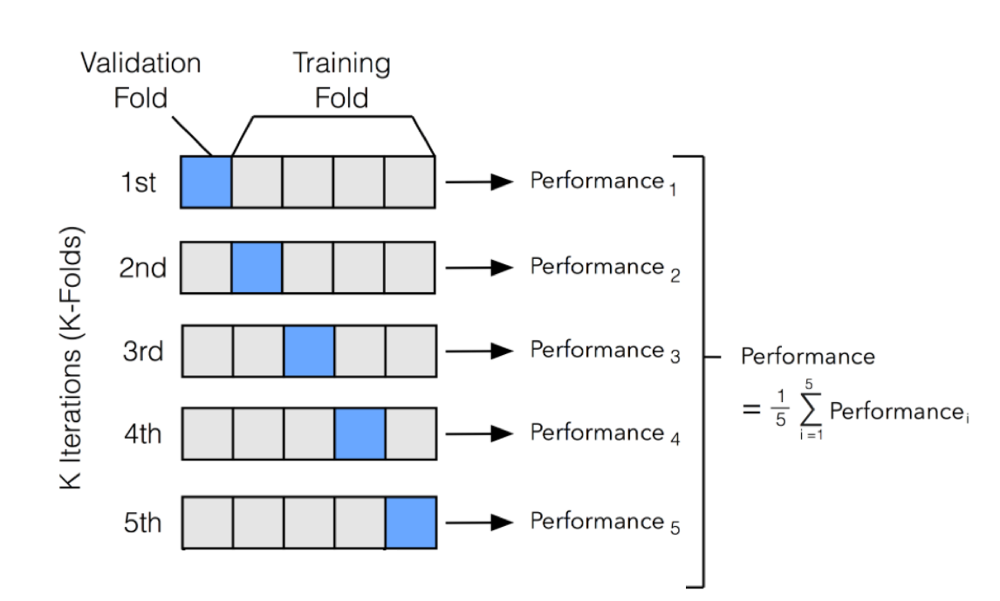

Использование перекрестной проверки при реализации оптимизации гиперпараметров может быть очень важным. Таким образом, мы могли бы избежать использования некоторых гиперпараметров, которые действительно хорошо работают с тренировочными данными, но не очень хорошо работают с тестовыми данными.



Теперь мы можем начать реализацию случайного поиска, сначала определив сетку гиперпараметров, которые будут случайным образом выбираться при вызове.RandomizedSearchCV (), Для этого примера я решил разделить наш тренировочный набор на 4 раза (cv = 4) и выберите 80 в качестве количества комбинаций для выборки (n_iter = 80). Использование scikit-learnbest_estimator_атрибут, мы можем затем получить набор гиперпараметров, которые лучше всего работали во время обучения, чтобы проверить нашу модель.



In [208]:
import numpy as np 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score

random_search = {'criterion': ['entropy', 'gini'],
               'max_depth': list(np.linspace(10, 1200, 10, dtype = int)) + [None],
               'max_features': ['auto', 'sqrt','log2', None],
               'min_samples_leaf': [4, 6, 8, 12],
               'min_samples_split': [5, 7, 10, 14],
               'n_estimators': list(np.linspace(151, 1200, 10, dtype = int))}

clf = RandomForestClassifier()
model = RandomizedSearchCV(estimator = clf, param_distributions = random_search, n_iter = 80, 
                               cv = 4, verbose= 5, random_state= 101, n_jobs = -1)
model.fit(X_Train,Y_Train)


Fitting 4 folds for each of 80 candidates, totalling 320 fits


/mnt/c/ds/env/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 2 members, which is less than n_splits=4.



KeyboardInterrupt: 

После обучения нашей модели мы можем визуализировать, как изменение некоторых ее гиперпараметров может повлиять на общую точность модели . В этом случае я решил наблюдать, как изменение количества оценок и критерия может повлиять на точность нашего случайного леса.



In [ ]:
import seaborn as sns

table = pd.pivot_table(pd.DataFrame(model.cv_results_),
    values='mean_test_score', index='param_n_estimators', 
                       columns='param_criterion')
     
sns.heatmap(table)

Теперь мы можем оценить, как наша модель работает с использованием случайного поиска. В этом случае использование случайного поиска приводит к последовательному увеличению точности по сравнению с нашей базовой моделью.




In [ ]:
predictionforest = model.best_estimator_.predict(X_Test)
print(confusion_matrix(Y_Test,predictionforest))
print(classification_report(Y_Test,predictionforest))
acc3 = accuracy_score(Y_Test,predictionforest)

## Grid Search

В Grid Search мы настраиваем сетку гиперпараметров и обучаем / тестируем нашу модель на каждой из возможных комбинаций.

Чтобы выбрать параметры для использования в Поиске по сетке, теперь мы можем посмотреть, какие параметры лучше всего работают со случайным поиском, и сформировать на их основе сетку, чтобы увидеть, сможем ли мы найти лучшую комбинацию.

Grid Search может быть реализован в Python с помощью scikit-learn GridSearchCV ()функция. Также по этому случаю я решил разделить наш тренировочный набор на 4 раза (cv = 4).



При использовании поиска по сетке пробуются все возможные комбинации параметров в сетке. В этом случае во время тренировки будет использовано 128000 комбинаций (2 × 10 × 4 × 4 × 4 × 10). Вместо этого в предыдущем примере поиска по сетке было использовано всего 80 комбинаций.



Поиск по сетке медленнее по сравнению со случайным поиском, но в целом он может быть более эффективным, поскольку может проходить через все пространство поиска. Вместо этого случайный поиск может быть быстрее, но может пропустить некоторые важные моменты в пространстве поиска.



In [ ]:
from sklearn.model_selection import GridSearchCV

grid_search = {
    'criterion': [model.best_params_['criterion']],
    'max_depth': [model.best_params_['max_depth']],
    'max_features': [model.best_params_['max_features']],
    'min_samples_leaf': [model.best_params_['min_samples_leaf'] - 2, 
                         model.best_params_['min_samples_leaf'], 
                         model.best_params_['min_samples_leaf'] + 2],
    'min_samples_split': [model.best_params_['min_samples_split'] - 3, 
                          model.best_params_['min_samples_split'], 
                          model.best_params_['min_samples_split'] + 3],
    'n_estimators': [model.best_params_['n_estimators'] - 150, 
                     model.best_params_['n_estimators'] - 100, 
                     model.best_params_['n_estimators'], 
                     model.best_params_['n_estimators'] + 100, 
                     model.best_params_['n_estimators'] + 150]
}

clf = RandomForestClassifier()
model = GridSearchCV(estimator = clf, param_grid = grid_search, 
                               cv = 4, verbose= 5, n_jobs = -1)
model.fit(X_Train,Y_Train)

predictionforest = model.best_estimator_.predict(X_Test)
print(confusion_matrix(Y_Test,predictionforest))
print(classification_report(Y_Test,predictionforest))
acc4 = accuracy_score(Y_Test,predictionforest)

## Автоматическая настройка гиперпараметра


Генетические алгоритмы пытаются применить механизмы естественного отбора к контекстам машинного обучения. Они вдохновлены дарвиновским процессом естественного отбора, и поэтому их также обычно называют эволюционными алгоритмами.

Давайте представим, что мы создаем совокупность N моделей машинного обучения с некоторыми предопределенными гиперпараметрами. Затем мы можем рассчитать точность каждой модели и принять решение оставить только половину моделей (те, которые работают лучше всего). Теперь мы можем сгенерировать некоторых потомков, имеющих гиперпараметры, аналогичные лучшим моделям, чтобы снова получить популяцию из N моделей. В этот момент мы снова можем рассчитать точность каждой модели и повторить цикл для определенного числа поколений. Таким образом, только лучшие модели выживут в конце процесса.

Чтобы реализовать генетические алгоритмы в Python, мы можем использовать Библиотеку TPOT

In [194]:
!pip install tpot

     |████████████████████████████████| 87 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 160 kB 9.2 MB/s eta 0:00:01
     |████████████████████████████████| 173.6 MB 14 kB/s  eta 0:00:01
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11955 sha256=819ed07437a4a27d706b4a92e0ce640898192a565dc1eef3d3b3b41b4f933a15
  Stored in directory: /home/herrenot/.cache/pip/wheels/a8/bb/8f/6b9328d23c2dcedbfeb8498b9f650d55d463089e3b8fc0bfb2
Successfully built stopit
You should consider upgrading via the '/mnt/c/ds/env/bin/python -m pip install --upgrade pip' command.


In [209]:
from tpot import TPOTClassifier

parameters = {'criterion': ['entropy', 'gini'],
               'max_depth': list(np.linspace(10, 1200, 10, dtype = int)) + [None],
               'max_features': ['auto', 'sqrt','log2', None],
               'min_samples_leaf': [4, 12],
               'min_samples_split': [5, 10],
               'n_estimators': list(np.linspace(151, 1200, 10, dtype = int))}
               
tpot_classifier = TPOTClassifier(generations= 5, population_size= 24, offspring_size= 12,
                                 verbosity= 2, early_stop= 12,
                                 config_dict=
                                 {'sklearn.ensemble.RandomForestClassifier': parameters}, 
                                 cv = 4, scoring = 'accuracy')
tpot_classifier.fit(X_Train,Y_Train) 

Optimization Progress:   0%|          | 0/84 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9971428571428571

Generation 2 - Current best internal CV score: 0.9971428571428571

Generation 3 - Current best internal CV score: 0.9971428571428571

Generation 4 - Current best internal CV score: 0.9971428571428571

Generation 5 - Current best internal CV score: 0.9971428571428571

Best pipeline: RandomForestClassifier(input_matrix, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=267)


TPOTClassifier(config_dict={'sklearn.ensemble.RandomForestClassifier': {'criterion': ['entropy',
                                                                                      'gini'],
                                                                        'max_depth': [10,
                                                                                      142,
                                                                                      274,
                                                                                      406,
                                                                                      538,
                                                                                      671,
                                                                                      803,
                                                                                      935,
                                                                                 

In [ ]:

acc4 = tpot_classifier.score(X_Test, Y_Test)
print(acc4)

In [ ]:
print('Base Accuracy vs Manual Search {:0.4f}%.'.format( 100 * (acc2 - acc1) / acc1))
print('Base Accuracy vs Random Search {:0.4f}%.'.format( 100 * (acc3 - acc1) / acc1))
print('Base Accuracy vs Grid Search {:0.4f}%.'.format( 100 * (acc4 - acc1) / acc1))
print('Base Accuracy vs Evolutionary Algorithms {:0.4f}%.'
      .format( 100 * (acc5 - acc1) / acc1))

    Base Accuracy vs Manual Search 0.0000%.
    Base Accuracy vs Random Search 2.1930%.
    Base Accuracy vs Grid Search 1.7544%.
    Base Accuracy vs Bayesian Optimization Accuracy -0.4386%.
    Base Accuracy vs Evolutionary Algorithms 2.1930%.
    Base Accuracy vs Optimized ANN 1.3158%.

Полученные результаты сильно зависят от выбранного пространства сетки и используемого набора данных. Поэтому в разных ситуациях разные методы оптимизации будут работать лучше, чем другие.



https://towardsdatascience.com/python-implementation-of-grid-search-and-random-search-for-hyperparameter-optimization-2d6a82ebf75c

https://github.com/pierpaolo28/Kaggle-Challenges/blob/master/credit-card-fraud-model-tuning.ipynb

https://www.kaggle.com/ldfreeman3/a-data-science-framework-to-achieve-99-accuracy

# Ансамбли

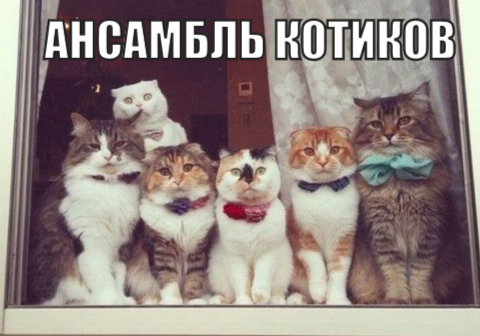

«Куча глупых деревьев учится исправлять ошибки друг друга»



    Всего, где подходят классические алгоритмы (но работают точнее)
    Поисковые системы (★)
    Компьютерное зрение
    Распознавание объектов

Популярные алгоритмы: Random Forest, Gradient Boosting

Ансамбли и нейросети — наши главные бойцы на пути к неминуемой сингулярности. Сегодня они дают самые точные результаты и используются всеми крупными компаниями в продакшене. Только о нейросетях трещат на каждом углу, а слова «бустинг» и «бэггинг», наверное, пугают только хипстеров с теккранча.

При всей их эффективности, идея до издевательства проста. Оказывается, если взять несколько не очень эффективных методов обучения и обучить исправлять ошибки друг друга, качество такой системы будет аж сильно выше, чем каждого из методов по отдельности.



Ансамбль можно собрать как угодно, хоть случайно нарезать в тазик классификаторы и залить регрессией. За точность, правда, тогда никто не ручается. Потому есть три проверенных способа делать ансамбли.



###### Стекинг 

Обучаем несколько разных алгоритмов и передаём их результаты на вход последнему, который принимает итоговое решение. Типа как девочки сначала опрашивают всех своих подружек, чтобы принять решение встречаться с парнем или нет.

Ключевое слово — разных алгоритмов, ведь один и тот же алгоритм, обученный на одних и тех же данных не имеет смысла. Каких — ваше дело, разве что в качестве решающего алгоритма чаще берут регрессию.



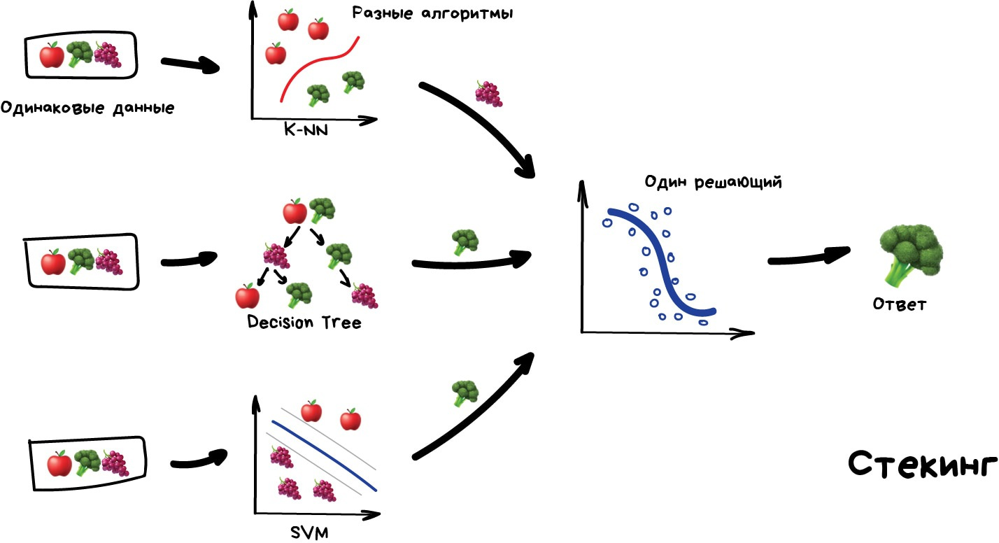

Чисто из опыта — стекинг на практике применяется редко, потому что два других метода обычно точнее.



###### Беггинг

Беггинг Он же Bootstrap AGGregatING. Обучаем один алгоритм много раз на случайных выборках из исходных данных. В самом конце усредняем ответы.

Данные в случайных выборках могут повторяться. То есть из набора 1-2-3 мы можем делать выборки 2-2-3, 1-2-2, 3-1-2 и так пока не надоест. На них мы обучаем один и тот же алгоритм несколько раз, а в конце вычисляем ответ простым голосованием.

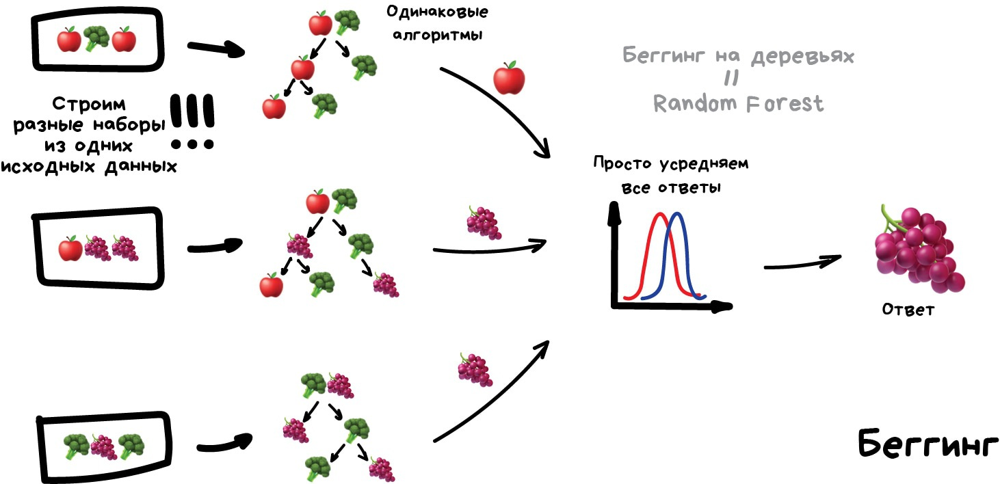

Самый популярный пример беггинга — алгоритм Random Forest, беггинг на деревьях, который и нарисован на картинке. Когда вы открываете камеру на телефоне и видите как она очертила лица людей в кадре желтыми прямоугольниками — скорее всего это их работа. Нейросеть будет слишком медлительна в реальном времени, а беггинг идеален, ведь он может считать свои деревья параллельно на всех шейдерах видеокарты.

Дикая способность параллелиться даёт беггингу преимущество даже над следующим методом, который работает точнее, но только в один поток.б

###### Бустинг 

Обучаем алгоритмы последовательно, каждый следующий уделяет особое внимание тем случаям, на которых ошибся предыдущий.

Как в беггинге, мы делаем выборки из исходных данных, но теперь не совсем случайно. В каждую новую выборку мы берём часть тех данных, на которых предыдущий алгоритм отработал неправильно. То есть как бы доучиваем новый алгоритм на ошибках предыдущего.

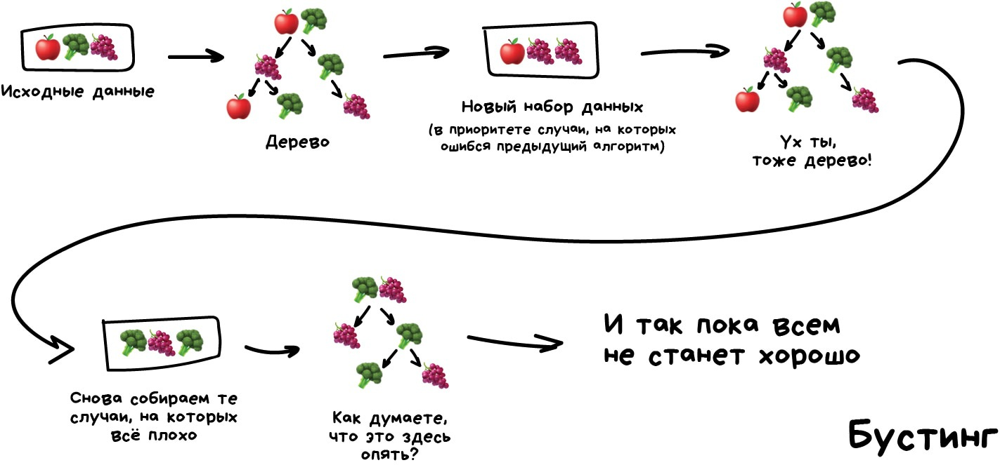

Плюсы — неистовая, даже нелегальная в некоторых странах, точность классификации, которой позавидуют все бабушки у подъезда. Минусы уже названы — не параллелится. Хотя всё равно работает быстрее нейросетей, которые как гружёные камазы с песком по сравнению с шустрым бустингом.

CatBoost vs. Light GBM vs. XGBoost

В отличие от CatBoost или LGBM, XGBoost не может сам обрабатывать категориальные функции, он принимает только числовые значения, аналогичные Random Forest. Поэтому перед подачей категориальных данных в XGBoost необходимо выполнять различные кодировки, такие как кодирование меток, среднее кодирование или горячее кодирование.

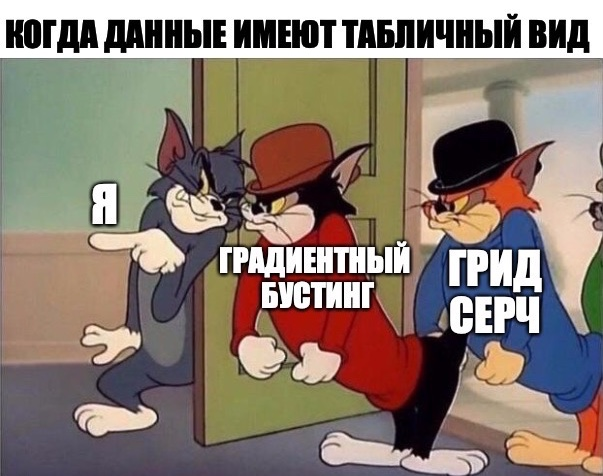

Пример из офф докумнетации

In [96]:
import xgboost as xgb
# read in data
dtrain = xgb.DMatrix('demo/data/agaricus.txt.train')
dtest = xgb.DMatrix('demo/data/agaricus.txt.test')
# specify parameters via map
param = {'max_depth':2, 'eta':1, 'objective':'binary:logistic' }
num_round = 2
bst = xgb.train(param, dtrain, num_round)
# make prediction
preds = bst.predict(dtest)

XGBoostError: [14:29:53] ../src/data/data.cc:765: Encountered parser error:
[14:29:53] ../dmlc-core/src/io/local_filesys.cc:104: LocalFileSystem.ListDirectory demo/data error: No such file or directory
Stack trace:
  [bt] (0) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x58d73d) [0x7fb9eb8d273d]
  [bt] (1) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x58edaf) [0x7fb9eb8d3daf]
  [bt] (2) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x5740a4) [0x7fb9eb8b90a4]
  [bt] (3) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x574ca7) [0x7fb9eb8b9ca7]
  [bt] (4) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x57523e) [0x7fb9eb8ba23e]
  [bt] (5) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x563f60) [0x7fb9eb8a8f60]
  [bt] (6) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x56453e) [0x7fb9eb8a953e]
  [bt] (7) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x544830) [0x7fb9eb889830]
  [bt] (8) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x524763) [0x7fb9eb869763]


Stack trace:
  [bt] (0) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x1135c9) [0x7fb9eb4585c9]
  [bt] (1) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(+0x659fa) [0x7fb9eb3aa9fa]
  [bt] (2) /mnt/c/ds/env/lib/python3.8/site-packages/xgboost/lib/libxgboost.so(XGDMatrixCreateFromFile+0xd2) [0x7fb9eb3e5b12]
  [bt] (3) /lib/x86_64-linux-gnu/libffi.so.7(+0x6ff5) [0x7fbabe354ff5]
  [bt] (4) /lib/x86_64-linux-gnu/libffi.so.7(+0x640a) [0x7fbabe35440a]
  [bt] (5) /usr/lib/python3.8/lib-dynload/_ctypes.cpython-38-x86_64-linux-gnu.so(_ctypes_callproc+0x5b6) [0x7fbabe36d316]
  [bt] (6) /usr/lib/python3.8/lib-dynload/_ctypes.cpython-38-x86_64-linux-gnu.so(+0x139ec) [0x7fbabe36d9ec]
  [bt] (7) /mnt/c/ds/env/bin/python(_PyObject_MakeTpCall+0x296) [0x5f6a46]
  [bt] (8) /mnt/c/ds/env/bin/python(_PyEval_EvalFrameDefault+0x5d3f) [0x570a1f]



###### прогнозирования цен на жилье

In [221]:
import pandas as pd
import xgboost as xgb
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


In [222]:
boston = load_boston()
X = pd.DataFrame(boston.data, columns=boston.feature_names)
y = pd.Series(boston.target)

In [226]:
X.head()


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


    CRIM уровень преступности на душу населения по городам
    ZN доля земли под жилую застройку зонирована под участки площадью более 25 000 кв.м.
    INDUS доля акров неторгового бизнеса на город
    Фиктивная переменная CHAS Charles River (= 1, если участок граничит с рекой;)
    Концентрация оксидов азота NOX 
    RM среднее количество комнат в жилом помещении
    AGE Доля  квартир, построенных до 1940 г.
    DIS взвешивает расстояния до пяти центров занятости Бостона
    RAD индекс доступности к радиальным магистралям
    НАЛОГ Полная ставка налога на имущество за 10 000 долларов США
    PTRATIO Соотношение учеников и учителей  по городам
    B доля чернокожих по городам.
    LSTAT %  статус населения
    MEDV Средняя стоимость домов, занимаемых владельцами, в 1000 долларов.

Чтобы оценить производительность нашей модели, мы разделили данные на обучающую и тестовую выборки.


In [229]:
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [230]:
regressor = xgb.XGBRegressor( 
    n_estimators=100, 
    reg_lambda=1, 
    gamma=0, 
    max_depth=3 
)

Подгоняем нашу модель к тренировочному набору.


In [231]:
regressor.fit(X_train, y_train)


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

Мы можем изучить относительную важность, приписываемую каждой характеристике, при определении цены дома.


In [232]:
pd.DataFrame(regressor.feature_importances_.reshape(1, -1), columns=boston.feature_names)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.042865,0.008141,0.019366,0.000833,0.02857,0.309125,0.016596,0.077491,0.018101,0.02525,0.080707,0.008573,0.364383


Как мы видим, процент населения низшего класса является лучшим предиктором цены дома.
Наконец, мы используем нашу модель, чтобы предсказать цену дома в Бостоне с учетом полученных данных.

In [233]:
y_pred = regressor.predict(X_test)

In [234]:
mean_squared_error(y_test, y_pred)


13.490507655429083

https://russianblogs.com/article/66121235194/

https://towardsdatascience.com/a-beginners-guide-to-xgboost-87f5d4c30ed7

# ДЗ

Используя XGBOOST предсказать размер чаевых в датасете TIPS

# Автоматическое обучение Часть 1

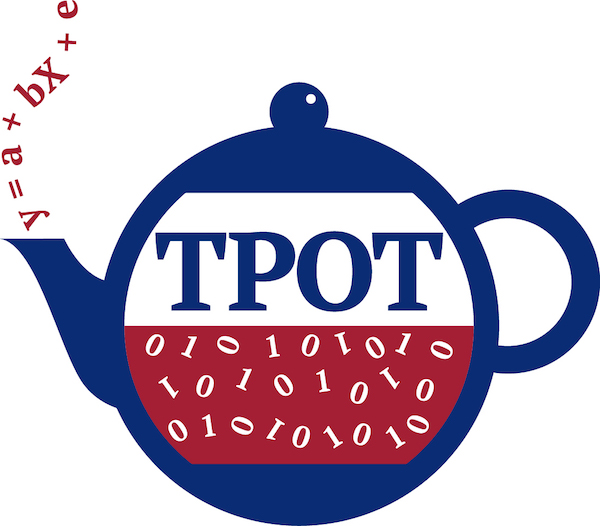

Большую часть времени инженеры по машинному обучению должны пройти необходимый процесс моделирования, где им нужно найти оптимальный алгоритм и настроить его с помощью гиперпараметров.

Самый общий подход в процессе оптимизации гиперпараметров — поиск по сетке — это своего рода поиск методом грубой силы для определения набора параметров, которые лучше всего подходят для модели. Недавние исследования показывают, что случайная оценка этих параметров в рамках поиска по сетке может найти лучшие из них. Да, вы уже где-то слышали, что «даже слепая белка находит орех». Этот сценарий подчеркивает неизбежность интеллектуального поиска в области гиперпараметров.

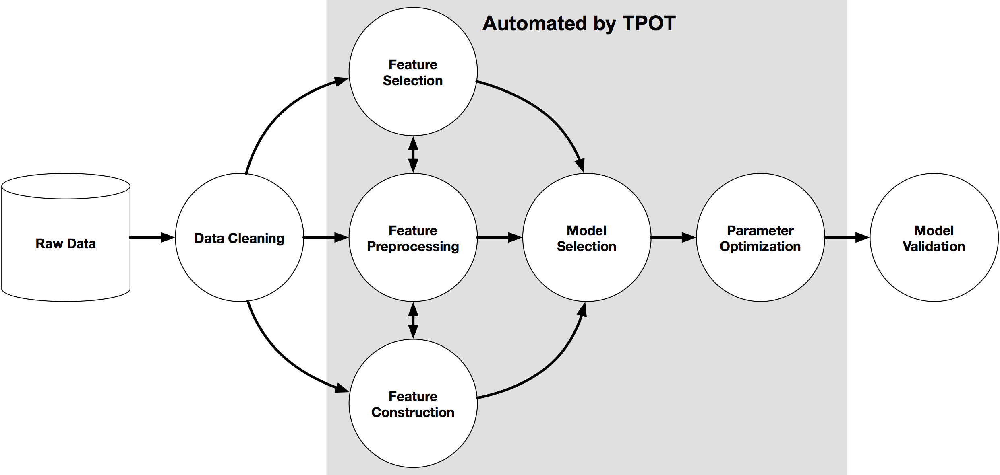

In [78]:
from tpot import TPOTClassifier
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split

digits = load_digits()
X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target,
                                                    train_size=0.75, test_size=0.25)

pipeline_optimizer = TPOTClassifier(generations=5, population_size=20, cv=5,
                                    random_state=42, verbosity=2)
pipeline_optimizer.fit(X_train, y_train)
print(pipeline_optimizer.score(X_test, y_test))
pipeline_optimizer.export('tpot_exported_pipeline.py')

/mnt/c/ds/env/lib/python3.8/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9866336224700538

Generation 2 - Current best internal CV score: 0.9873798705768966

Generation 3 - Current best internal CV score: 0.9873798705768966

Generation 4 - Current best internal CV score: 0.9873798705768966

Generation 5 - Current best internal CV score: 0.9873798705768966

Best pipeline: KNeighborsClassifier(input_matrix, n_neighbors=3, p=2, weights=distance)
0.9888888888888889


(1797, 64)


<Figure size 432x288 with 0 Axes>

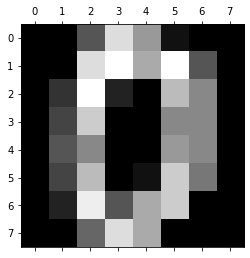

In [79]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
digits = load_digits()
print(digits.data.shape)
(1797, 64)
plt.gray()
plt.matshow(digits.images[0])

plt.show()

###### Посмотрим на примере с ДЗ

In [80]:
df = pd.read_excel('/mnt/c/ds/DataSet_w_NA.xlsx', sheet_name="Испорченные факты")

In [81]:
df =pd.pivot_table(df, values=['Продажи, руб', 'Продажи, шт','Повторение заказа','Маржинальная прибыль','Повторение товара'], index=["Факты.Товар ID"],
                     aggfunc={'Продажи, шт': [np.median, np.sum],
                              'Продажи, руб': np.sum,
                              'Повторение заказа': np.sum,
                              'Маржинальная прибыль': np.sum})
newname=df.columns.map('_'.join)
df.columns=newname
df=df.reset_index()

In [87]:
total_sale=df['Продажи, руб_sum'].sum()
df['Доля']=df['Продажи, руб_sum']/total_sale * 100
df = df.sort_values(by=('Продажи, руб_sum'), ascending=False)
df=df.assign(sum_d=df['Доля'].cumsum())
df.loc[(df['sum_d'] <= 80), 'ABC'] = 'A'
df.loc[(df['sum_d'] > 80) & (df['sum_d'] <= 95), 'ABC'] = 'B'
df.loc[(df['sum_d'] > 95), 'ABC'] = 'C'

df['Стоимость, руб'] = df['Продажи, руб_sum']/df['Продажи, шт_sum']
df['Продажи в следующем периоде']= (df['Продажи, шт_sum'] + df['Продажи, шт_median']) *df['Стоимость, руб']
total_sale_next=df['Продажи в следующем периоде'].sum()
df['Доля_будущая']=df['Продажи в следующем периоде']/total_sale_next * 100
df = df.sort_values(by=('Продажи в следующем периоде'), ascending=False)
df=df.assign(sum_d_next=df['Доля_будущая'].cumsum())
df.loc[(df['sum_d_next'] <= 80), 'ABC_next'] = 'A'
df.loc[(df['sum_d_next'] > 80) & (df['sum_d_next'] <= 95), 'ABC_next'] = 'B'
df.loc[(df['sum_d_next'] > 95), 'ABC_next'] = 'C'

In [88]:
df_clean = df.drop(columns=['Факты.Товар ID', 
                            'Продажи, шт_median', 
                            'Доля', 'sum_d', 
                            'Продажи в следующем периоде', 
                            'Доля_будущая', 
                            'sum_d_next'])

In [89]:
df_clean = df_clean.dropna()
df_clean.loc[(df_clean['ABC'] == 'A'), 'class'] = '0'
df_clean.loc[(df_clean['ABC'] == 'B'), 'class'] = '1'
df_clean.loc[(df_clean['ABC'] == 'C'), 'class'] = '2'
df_clean.loc[(df_clean['ABC_next'] == 'A'), 'class_next'] = '0'
df_clean.loc[(df_clean['ABC_next'] == 'B'), 'class_next'] = '1'
df_clean.loc[(df_clean['ABC_next'] == 'C'), 'class_next'] = '2'
df_clean = df_clean.drop(columns=['ABC', 'ABC_next'])

In [90]:
X = df_clean.drop(columns='class_next')
Y = df_clean['class_next']

In [93]:
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=0.3, shuffle=True)


In [95]:

pipeline_optimizer = TPOTClassifier(generations=5, population_size=20, cv=5,
                                    random_state=42, verbosity=2)
pipeline_optimizer.fit(X_train, Y_train)
print(pipeline_optimizer.score(X_test, Y_test))
pipeline_optimizer.export('tpot_exported_pipeline.py')

Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9791955017301038

Generation 2 - Current best internal CV score: 0.9798875432525952

Generation 3 - Current best internal CV score: 0.9798875432525952

Generation 4 - Current best internal CV score: 0.9798875432525952

Generation 5 - Current best internal CV score: 0.9798971549404076

Best pipeline: GradientBoostingClassifier(input_matrix, learning_rate=0.5, max_depth=8, max_features=0.3, min_samples_leaf=14, min_samples_split=16, n_estimators=100, subsample=0.9000000000000001)
0.0


# TQDM - IDDQD для DS`a

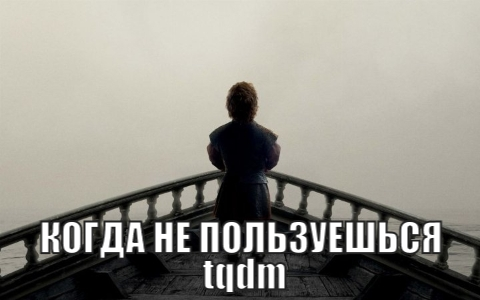

In [4]:
import time
from tqdm import tqdm
for i in tqdm(range(100)):
    time.sleep(1)

100%|██████████| 100/100 [01:40<00:00,  1.00s/it]


In [5]:
from tqdm.auto import tqdm, trange
from time import sleep

bar = trange(10)
for i in bar:
    # Print using tqdm class method .write()
    sleep(0.1)
    if not (i % 3):
        tqdm.write("Done task %i" % i)
    # Can also use bar.write()

  0%|          | 0/10 [00:00<?, ?it/s]

Done task 0
Done task 3
Done task 6
Done task 9


https://github.com/tqdm/tqdm

# Сохранение моделей

## Pickle

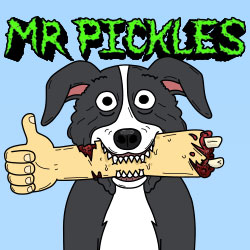

Pickle - это стандартный способ сериализации объектов в Python.

In [6]:
import pandas
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import pickle
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/pima-indians-diabetes.data.csv"
names = ['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age', 'class']
dataframe = pandas.read_csv(url, names=names)
array = dataframe.values
X = array[:,0:8]
Y = array[:,8]
test_size = 0.33
seed = 7
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(X, Y, test_size=test_size, random_state=seed)
# Fit the model on 33%
model = LogisticRegression()
model.fit(X_train, Y_train)

/mnt/c/ds/env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [7]:
# save the model to disk
filename = 'finalized_model.sav'


In [8]:
pickle.dump(model, open(filename, 'wb'))

---

In [9]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))


In [10]:
result = loaded_model.score(X_test, Y_test)
print(result)


0.7874015748031497


Немного усложним

In [12]:
 from sklearn.linear_model import LogisticRegression 
 from sklearn.datasets import load_iris 
 from sklearn.model_selection import train_test_split 
 
 # Load and split data 
 data = load_iris() 
 Xtrain, Xtest, Ytrain, Ytest = train_test_split(data.data, data.target, test_size=0.3, random_state=4) 

In [19]:
 model = LogisticRegression(C=0.1, 
 max_iter=20, 
 fit_intercept=True, 
 n_jobs=4, 
 solver='liblinear') 
 model.fit(Xtrain, Ytrain) 

/mnt/c/ds/env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


LogisticRegression(C=0.1, max_iter=20, n_jobs=4, solver='liblinear')

In [20]:
model.coef_ 

array([[ 0.14581391,  0.66326446, -1.08472348, -0.4730456 ],
       [ 0.08769022, -0.54987377,  0.23139425, -0.25753471],
       [-0.56586916, -0.45528042,  0.80532348,  0.69638572]])

In [ ]:
 import pickle 


Сохраняем модель

In [22]:
pkl_filename = "pickle_model.pkl" 
with open(pkl_filename, 'wb') as file: 
 pickle.dump(model, file) 

Загружаем модель

In [24]:
# Load from file 
with open(pkl_filename, 'rb') as file: 
    pickle_model = pickle.load(file) 

In [26]:
score = pickle_model.score(Xtest, Ytest) 
print("Test score: {0:.2f} %".format(100 * score)) 
Ypredict = pickle_model.predict(Xtest) 

Test score: 91.11 %


## Модуль Joblib


In [30]:
from sklearn.externals import joblib - БОЛЬШЕ НЕ РАБОТАЕТ


ImportError: cannot import name 'joblib' from 'sklearn.externals' (/mnt/c/ds/env/lib/python3.8/site-packages/sklearn/externals/__init__.py)

In [31]:
import joblib


In [37]:
 from sklearn.linear_model import LogisticRegression 
 from sklearn.datasets import load_iris 
 from sklearn.model_selection import train_test_split 
 
 # Load and split data 
 data = load_iris() 
 Xtrain, Xtest, Ytrain, Ytest = train_test_split(data.data, data.target, test_size=0.3, random_state=4) 

In [38]:
 model = LogisticRegression(C=0.1, 
 max_iter=20, 
 fit_intercept=True, 
 n_jobs=4, 
 solver='liblinear') 
 model.fit(Xtrain, Ytrain) 

/mnt/c/ds/env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


LogisticRegression(C=0.1, max_iter=20, n_jobs=4, solver='liblinear')

Сохраняем модель

In [39]:
filename = 'finalized_model.sav'
joblib.dump(model, filename)

['finalized_model.sav']

Загружаем модель

In [41]:
loaded_model = joblib.load(filename)
result = loaded_model.score(Xtest, Ytest)
print(result)

0.9111111111111111


Joblib предлагает немного более простой рабочий процесс по сравнению с Pickle. В то время как Pickle требует передачи файлового объекта в качестве аргумента, Joblib работает как с файловыми объектами, так и с строковыми именами файлов. Если ваша модель содержит большие массивы данных, каждый массив будет храниться в отдельном файле, но процедура сохранения и восстановления останется прежней. Joblib также поддерживает различные методы сжатия, такие как zlib, gzip, bz2, а также различные уровни сжатия.

Совместимость версий Python. В документации к обоим инструментам указано, что не рекомендуется (де) сериализовать объекты в разных версиях Python, хотя это может работать при изменении второстепенных версий.

Совместимость модели. Одна из наиболее частых ошибок - сохранение модели с помощью Pickle или Joblib, а затем изменение модели перед попыткой восстановления из файла. Внутренняя структура модели должна оставаться неизменной между сохранением и перезагрузкой.

Последняя проблема с Pickle и Joblib связана с безопасностью. Оба инструмента могут содержать вредоносный код, поэтому не рекомендуется восстанавливать данные из ненадежных или непроверенных источников.